# Import files

If you run this notebook on google colab you need to upload python scripts on the left panel.
To that end click on the left "Files" (or "Fichiers" in French) and drag and drop :
- python scripts from "Code" folder of github repository.
- csv files or xls files from "data" folder.
- Tensorflow model (files with .data or .index extensions) in the "Results" folder if you want to use neural network while avoiding the training step.
- csv files in "Results" folder if you want load Results presented in our paper.


In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI
import neuralNetwork


import importlib

# Load data

In order to reproduce our paper experiments, execute cells from part "Load preformatted data". 

Each source of data produces the following objects : 
- bootstrap manages discounting and dividend.
- dataSet contains the training set.
- dataSetTest contains the testing set.
- $S0$ the spot value of the underlying 

#### DAX Data

For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.
- "8_8_2001__filterdax.dat" for tikohnov local volatility.

In [ ]:
workingFolder = "./data/09082001/"

In [ ]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files (DAX data)
For a day x you must load :
- "x.dat.modelparam.dat"
- "x.dat.impliedvol.dat"
- "x.dat.calibr.out.dat"
- "x.dat"

In [ ]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [ ]:
importlib.reload(loadData)

In [ ]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

File required : 
- yieldCurve.dat.
- Option_SPX_18_Mai_2019Feuille2.xlsm

In [ ]:
workingFolder = "./"#"./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [ ]:
importlib.reload(loadData)

####  Eurostoxx data

File required : Data_EuroStoxx50_20190110_all_for_Marc.xlsx

In [ ]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [ ]:
bootstrap.discountShortRate(10)

#### Load preformatted data

File required : 
- testingDataSet.csv
- trainingDataSet.csv
- dfCurve.csv

In [3]:
workingFolder = "./"#"./data/"
trainingSet, testingSet, bootstrap, S0 = loadData.loadFormattedData(workingFolder)

# Formatting data

### Bootstrapping Rate Curve methodology


We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

bootstrap object has several members :
- **riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
- **riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons
- **divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
- **divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

These curve should satisfy the call-put parity.

#### Change of variable

Neural network on modified prices with modified strike as input such that discounting and dividend don't intervene in Dupire formula calculation.


- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.
- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.
- $k$ corresponds to "ChangedStrike" column.
- $\exp{(\int_{0}^{T} q_t dt)}$ corresponds to "DividendFactor" column.


In [4]:
#dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
#                                       S0, 
#                                       bootstrap)

In [5]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [6]:
dataSetTest.head()

Price     Delta  ...  logMoneyness  impliedTotalVariance
Strike Maturity                   ...                                    
1700.0 0.246      0.80 -0.004171  ...     -0.521416              0.042306
2300.0 0.419     14.30 -0.069169  ...     -0.220227              0.024620
2350.0 0.093      1.20 -0.013019  ...     -0.196766              0.008143
       0.112      1.85 -0.018041  ...     -0.197041              0.009257
2400.0 0.419     20.55 -0.099289  ...     -0.177667              0.021477

[5 rows x 15 columns]

In [7]:
#Run this cell if you want to record your datasets
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [8]:
#Size of training set
dataSet.shape

(135, 15)

In [9]:
#Size of testing set
dataSetTest.shape

(144, 15)

In [10]:
S0

2859.53

In [11]:
#Threshold for eliminating low prices 
threshold = pd.concat([dataSet, dataSetTest])["Price"].sort_values().iloc[int(0.05 * pd.concat([dataSet, dataSetTest]).shape[0])]

In [12]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

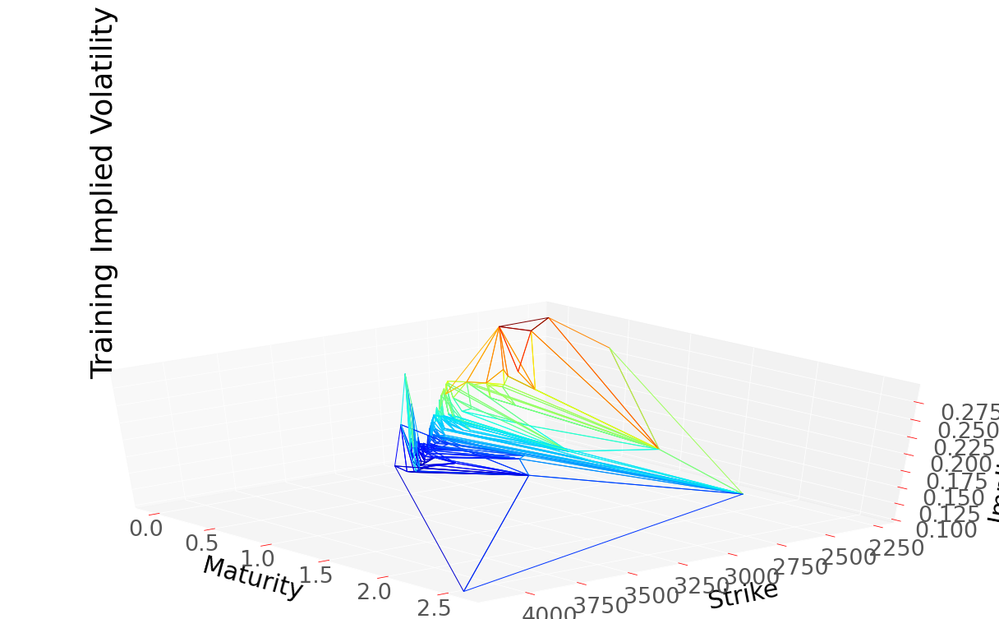

In [13]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'Training Implied Volatility')

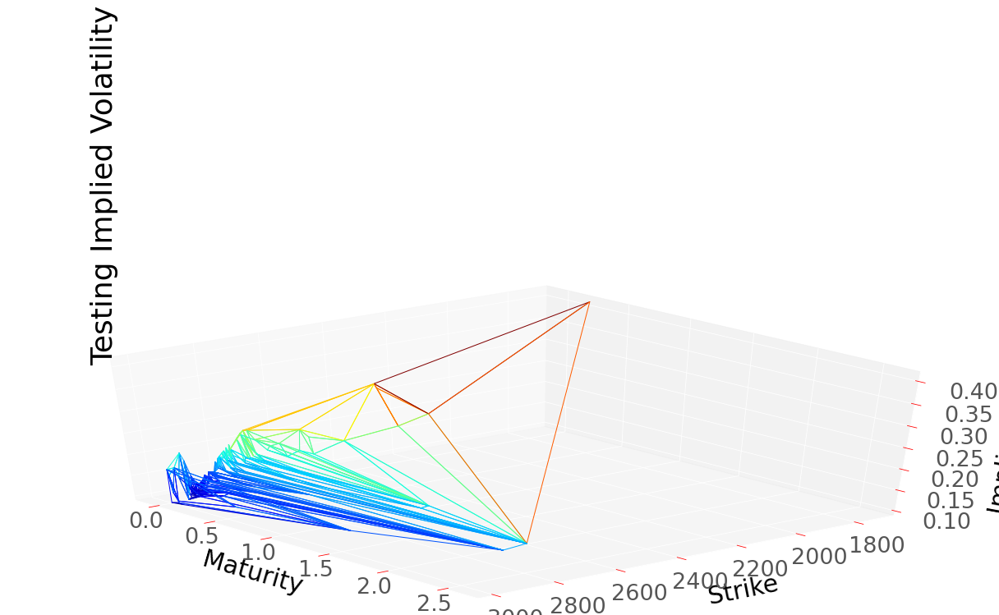

In [14]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'Testing Implied Volatility')

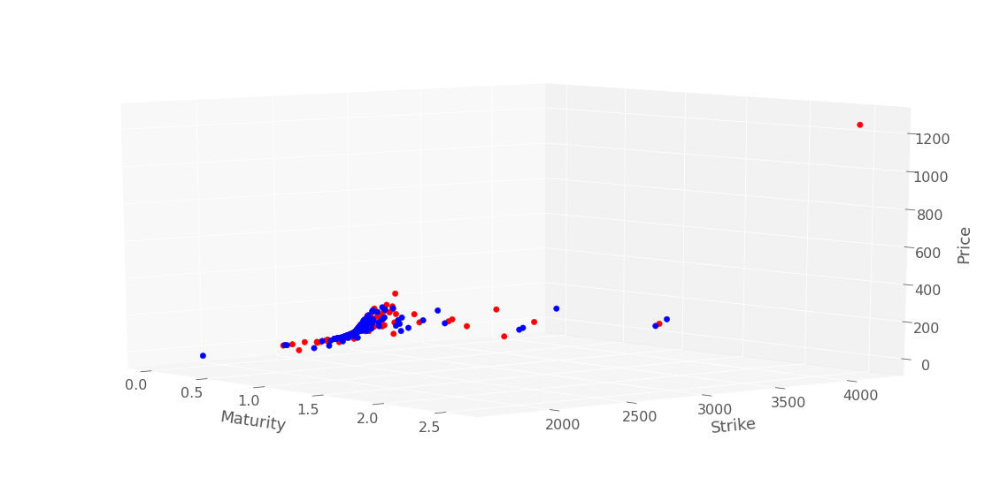

In [15]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'Price Surfaces')

In [16]:
testingSet.shape

(144, 15)

In [17]:
trainingSet.shape

(135, 15)

In [18]:
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

Scaler is fitted on training set.

In [19]:
dataSet["locvol"] = np.ones_like(dataSet["ImpliedVol"]) 
dataSetTest["locvol"] = np.ones_like(dataSetTest["ImpliedVol"]) 

In [20]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = neuralNetwork.transformCustom(dataSet, scaler)
scaledDataSetTest = neuralNetwork.transformCustom(dataSetTest, scaler)

In [21]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance,locvol
Strike,Maturity,,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020,1.0
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800,1.0
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281,1.0
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907,1.0
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013,1.0


In [22]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

Display original data.

In [23]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


In [24]:
dataSet.shape

(135, 16)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


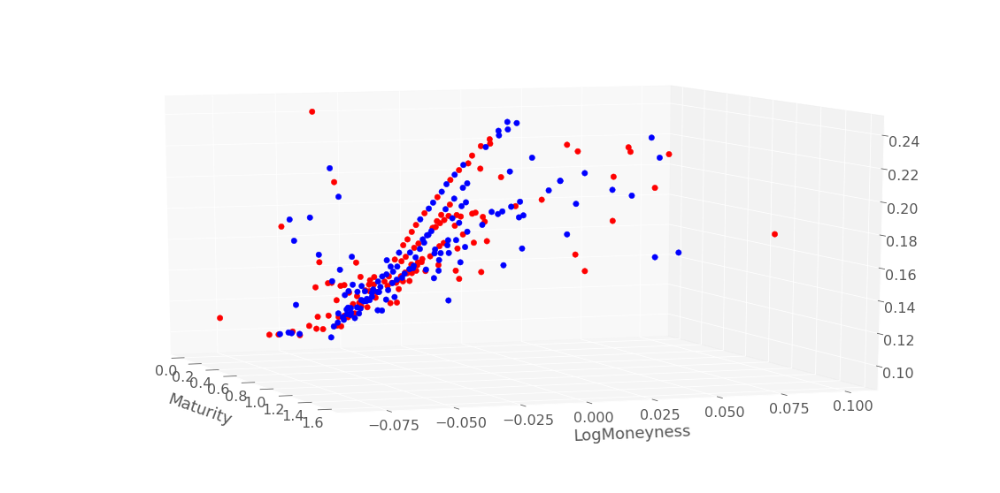

In [25]:
filter = dataSet["Maturity"] <= 2.0
filterTest = dataSetTest["Maturity"] <= 2.0
logMin = np.log(KMin/S0)
logMax = 0.1 #np.log(KMax/S0), 
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[filterTest]["ImpliedVol"], S0), 
                      plotTools.convertToLogMoneyness(dataSet[filter]["ImpliedVol"], S0), 
                      yMin=logMin,
                      yMax=logMax,
                      az = 340,
                      Title = 'Implied Vol Surface')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


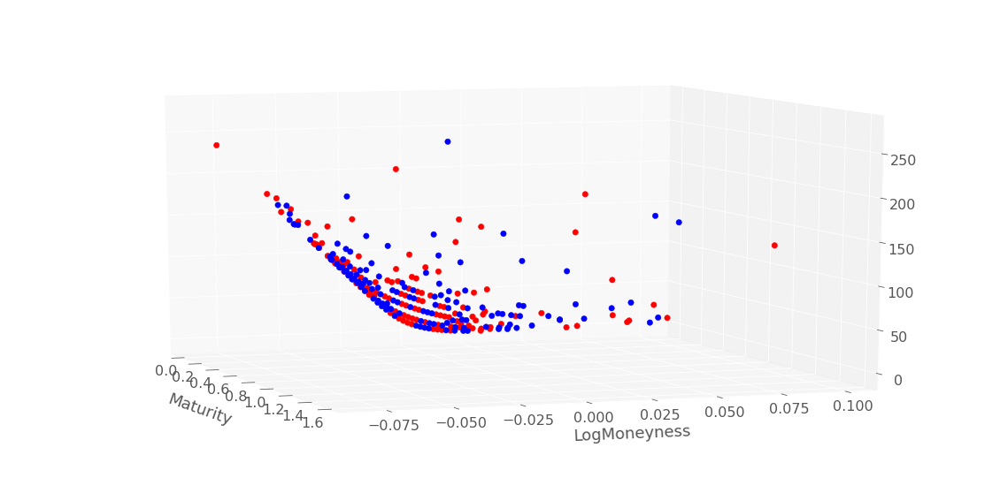

In [26]:
filter = dataSet["Maturity"] <= 2.0
filterTest = dataSetTest["Maturity"] <= 2.0
logMin = np.log(KMin/S0), 
logMax = 0.1 #np.log(KMax/S0), 
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[filterTest]["Price"], S0), 
                      plotTools.convertToLogMoneyness(dataSet[filter]["Price"], S0), 
                      yMin=logMin,
                      yMax=logMax,
                      az = 340,
                      Title = 'Price Surface')

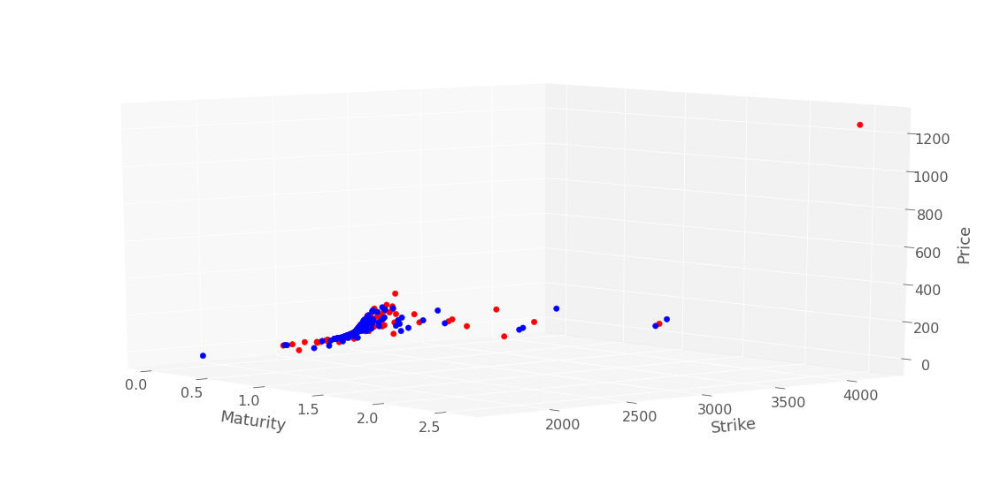

In [27]:
plotTools.plot2Series(dataSetTest["Price"], 
                      dataSet["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [28]:
importlib.reload(plotTools)

<module 'plotTools' from '/content/plotTools.py'>

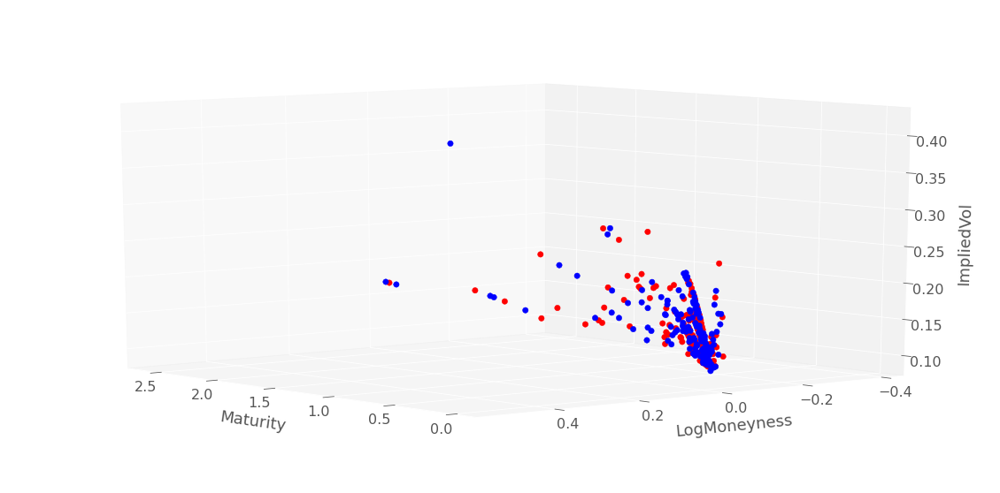

In [29]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'Implied vol Surfaces', 
                      az=140)

In [ ]:
%matplotlib inline

# Learning Price
Yon can skip the training step by loading in the left panel in colab workspace tensorflow models. These models are contained in the results folder of github repository.

In [61]:
hyperparameters = {}
#penalization coefficient
hyperparameters["lambdaLocVol"] = 10#1#0.001#0.01 #100
hyperparameters["lambdaSoft"] = 1000#100#0.0001#10#10 #100 
hyperparameters["lambdaGamma"] = 10000000#10000#100#10 #10000

#Derivative soft constraints parameters
hyperparameters["lowerBoundTheta"] = 0.01
hyperparameters["lowerBoundGamma"] = 0.00001

#Local variance parameters
hyperparameters["DupireVarCap"] = 10
hyperparameters["DupireVolLowerBound"] = 0.05
hyperparameters["DupireVolUpperBound"] = 0.40

#Learning scheduler coefficient
hyperparameters["LearningRateStart"] = 0.1
hyperparameters["Patience"] = 100
hyperparameters["batchSize"] = 50
hyperparameters["FinalLearningRate"] = 1e-6
hyperparameters["FixedLearningRate"] = False

#Training parameters
hyperparameters["nbUnits"] = 100 #number of units for hidden layers
hyperparameters["maxEpoch"] = 10000#10000 #maximum number of epochs
hyperparameters["ArtificialPenalizationGrid"] = False #Compute no-arbitrage penalization on an additional 5000 points grid

In [ ]:
hyperparameters = {}
#penalization coefficient
hyperparameters["lambdaLocVol"] = 10
hyperparameters["lambdaSoft"] = 1000 
hyperparameters["lambdaGamma"] = 100000

#Derivative soft constraints parameters
hyperparameters["lowerBoundTheta"] = 0.01
hyperparameters["lowerBoundGamma"] = 0.00001

#Local variance parameters
hyperparameters["DupireVarCap"] = 10
hyperparameters["DupireVolLowerBound"] = 0.05
hyperparameters["DupireVolUpperBound"] = 0.40

#Learning scheduler coefficient
hyperparameters["LearningRateStart"] = 0.1
hyperparameters["Patience"] = 100
hyperparameters["batchSize"] = 50
hyperparameters["FinalLearningRate"] = 1e-6
hyperparameters["FixedLearningRate"] = False

#Training parameters
hyperparameters["nbUnits"] = 200 #number of units for hidden layers
hyperparameters["maxEpoch"] = 10000 #maximum number of epochs

In [ ]:
importlib.reload(plotTools)

#### No penalization bounds on local variance.

In [ ]:
#Execute this cell if you want to fit neural network with prices
res = neuralNetwork.create_train_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                       scaledDataSet,
                                       False,
                                       hyperparameters,
                                       scaler,
                                       modelName = "UnconstrainedDupireVolModel")
y_pred, volLocale, dNN_T, gNN_K, lossSerie = res

In [ ]:
plotTools.plotEpochLoss(lossSerie)
lossSerie.iloc[-1]

Best loss (hidden nodes: 100, iterations: 0): 0.15
Best Penalization :  [1.0873228, [0.0, 0.0, 0.079682626]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0150096845]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


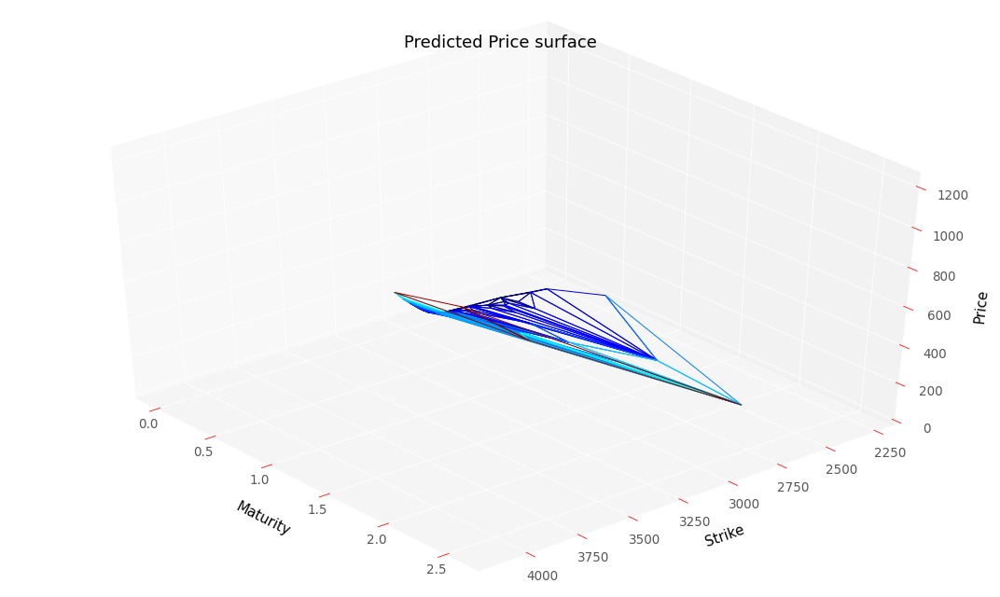

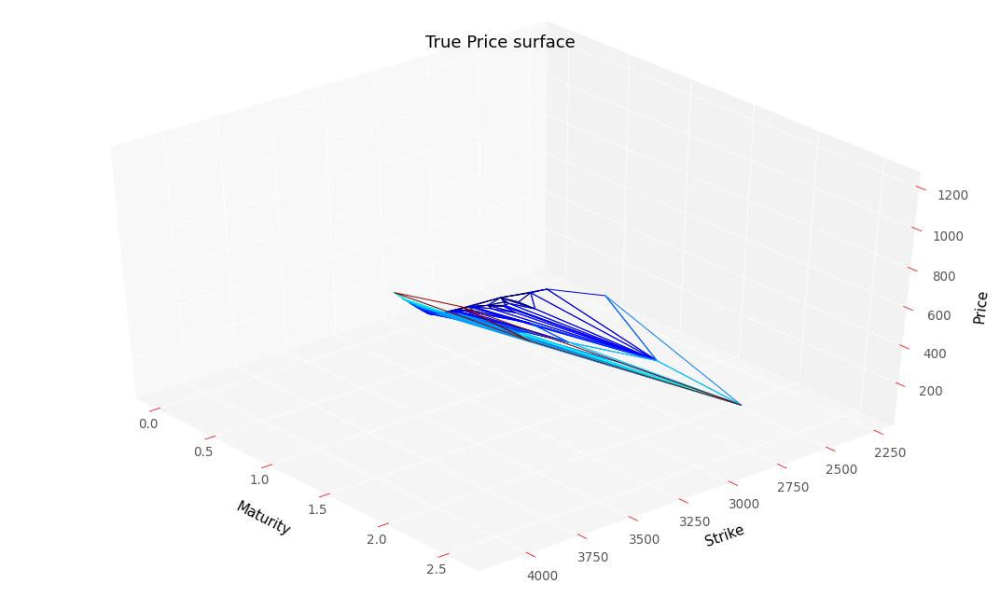

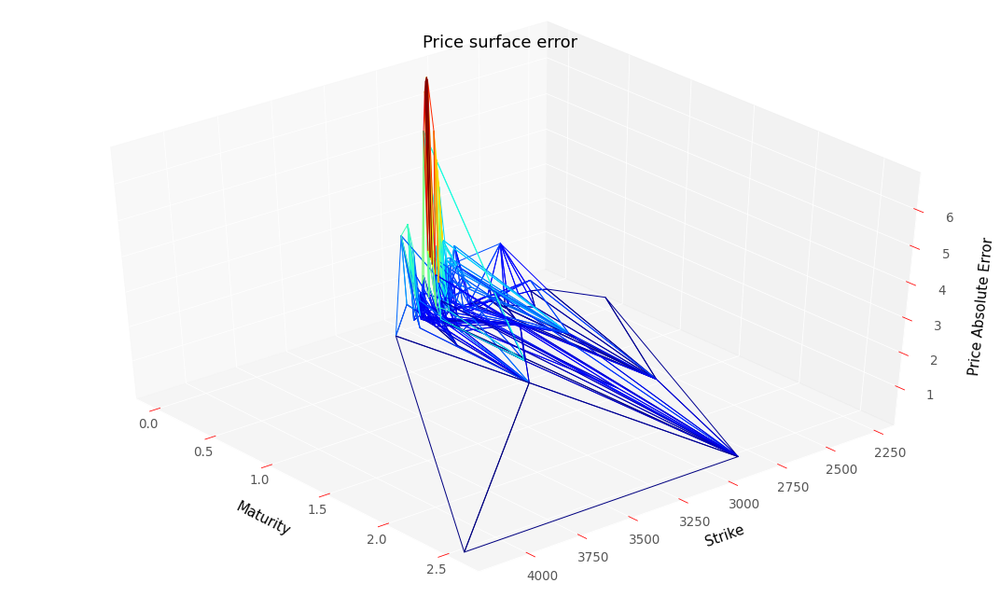

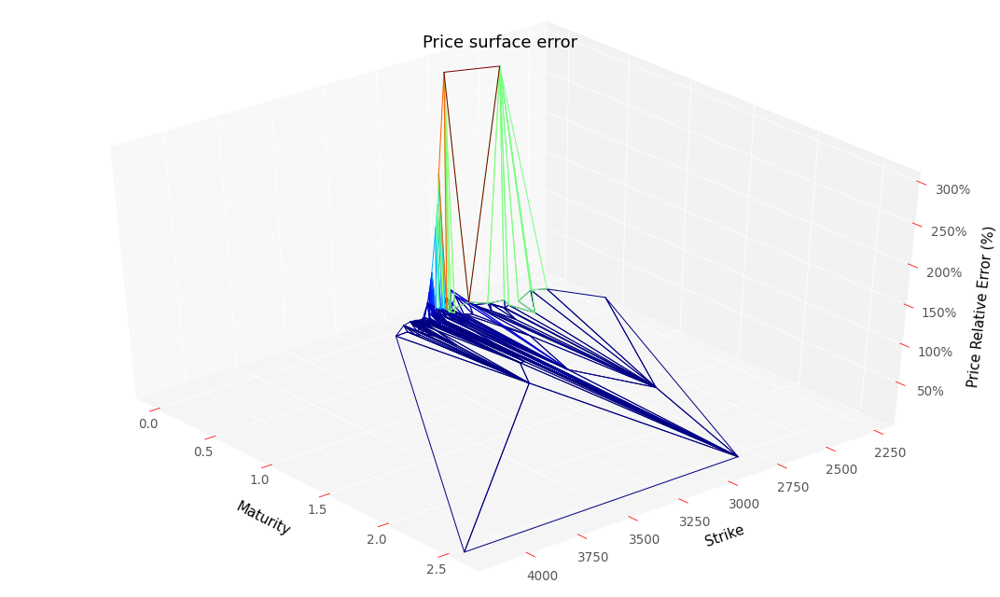

RMSE :  1.7959547062460604
RMSE Relative:  0.45367323643384


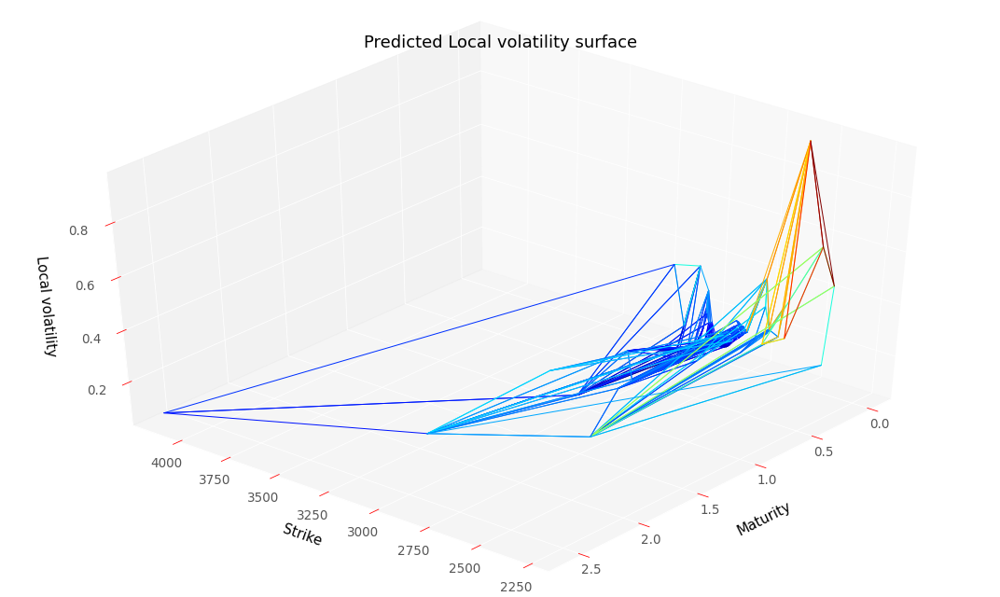

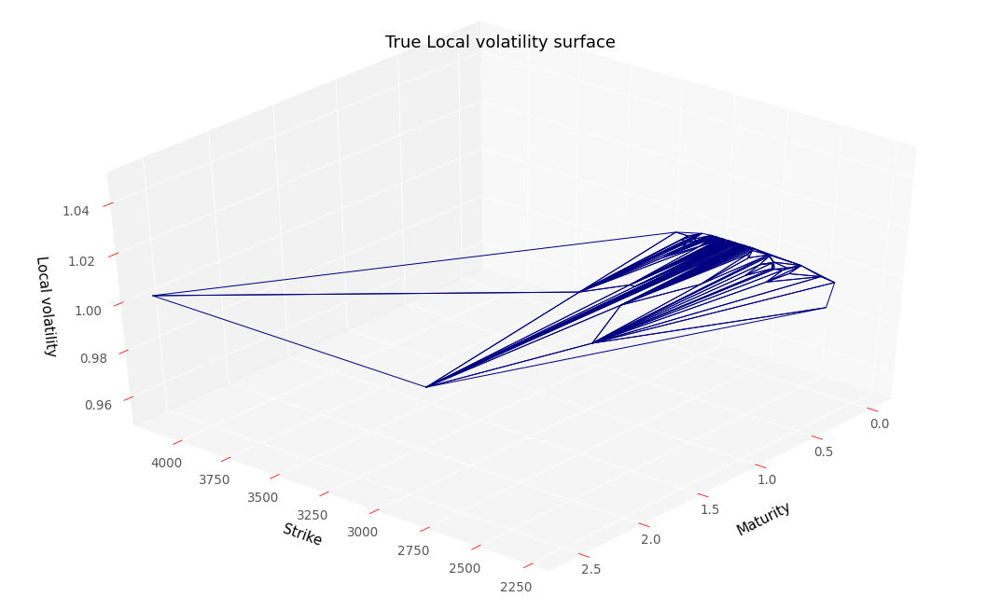

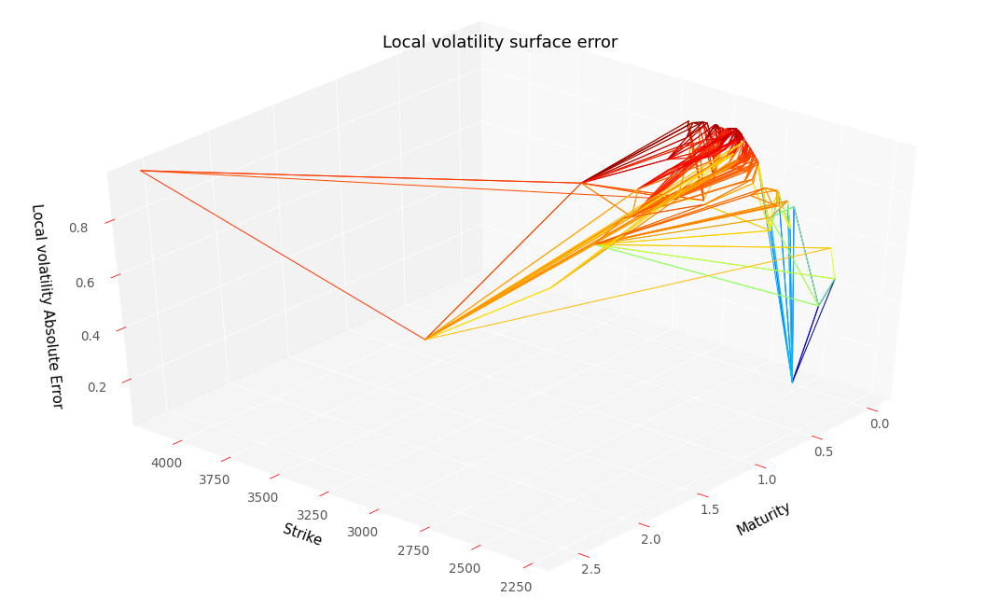

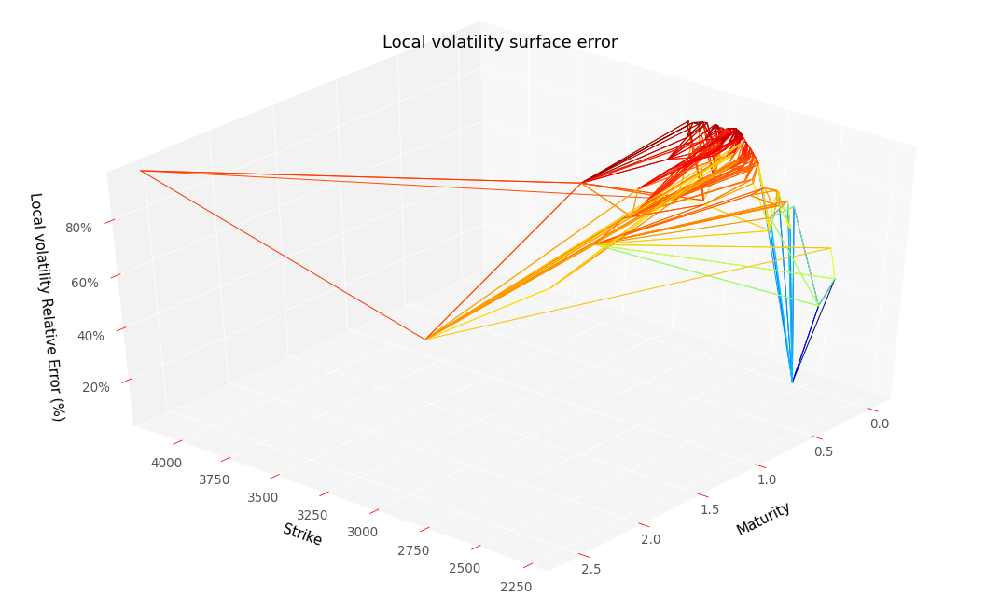

RMSE :  0.8351467723105762
RMSE Relative:  0.8351467723105762


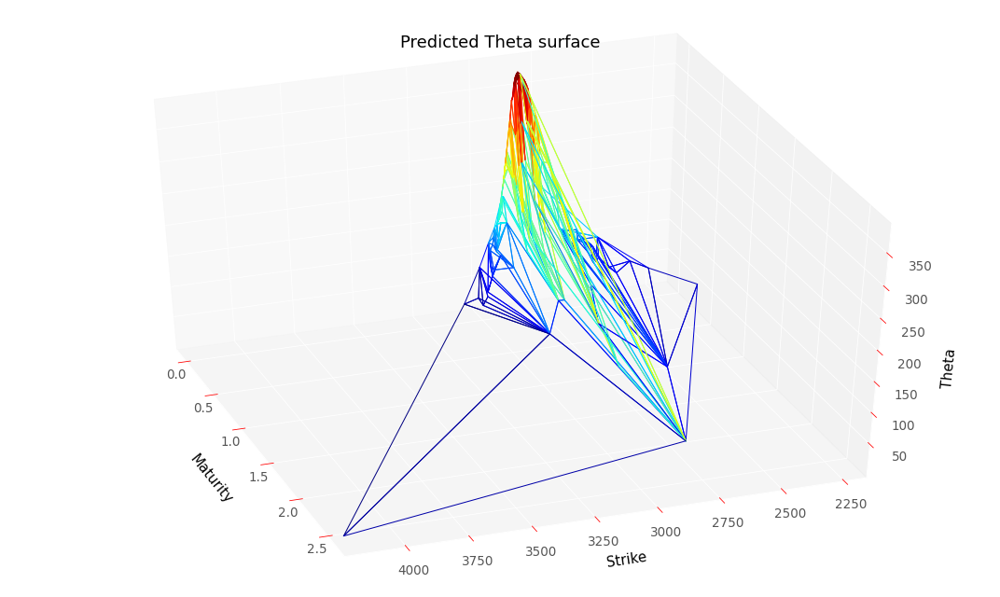

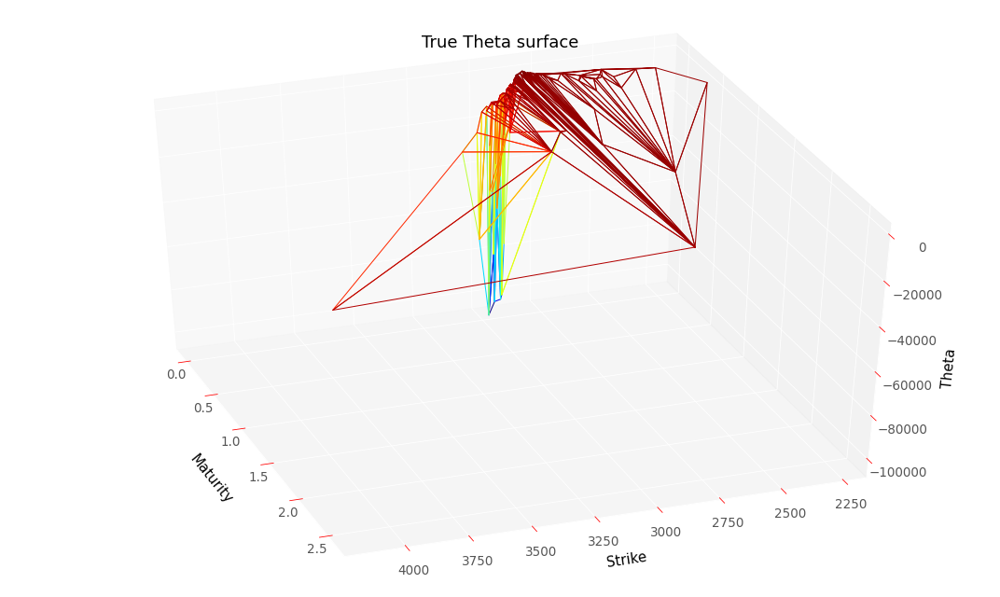

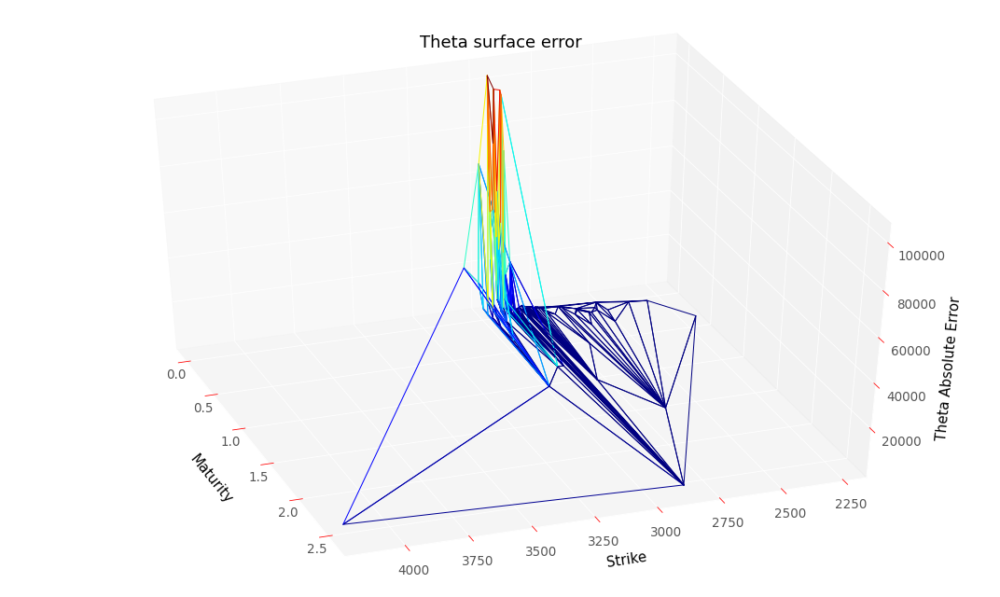

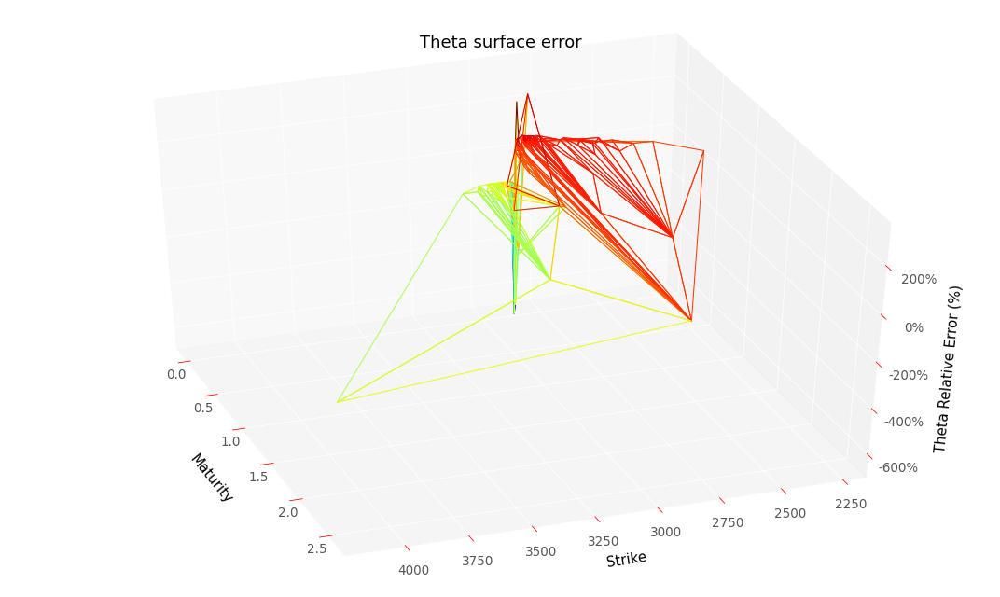

RMSE :  24457.9885565252
RMSE Relative:  1.307153546454654


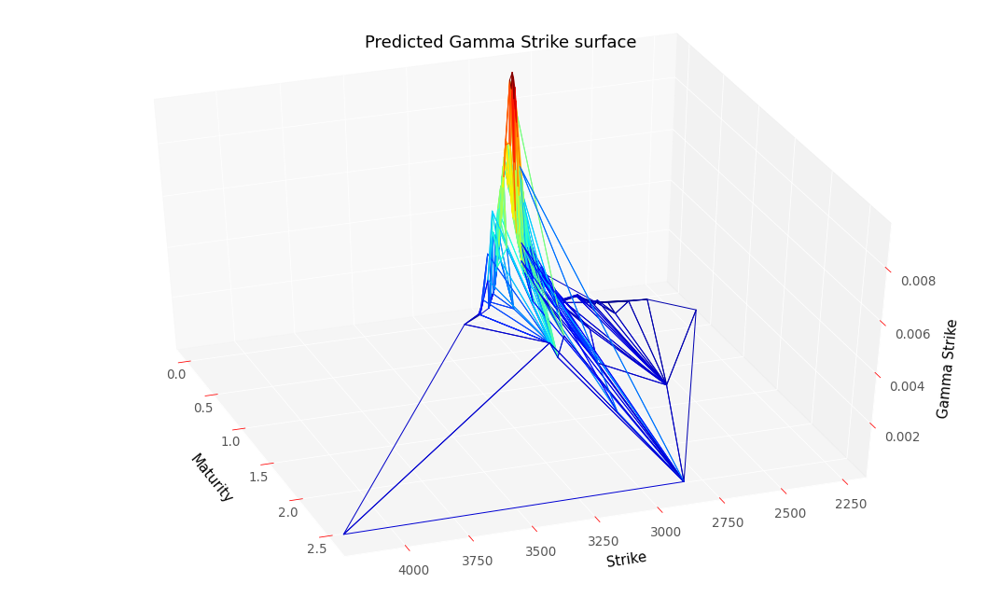

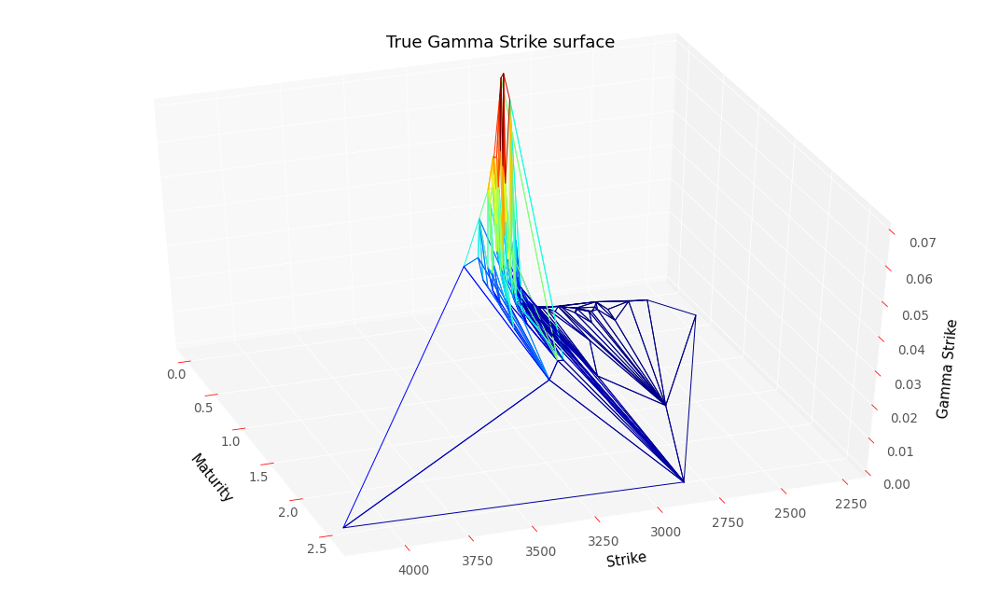

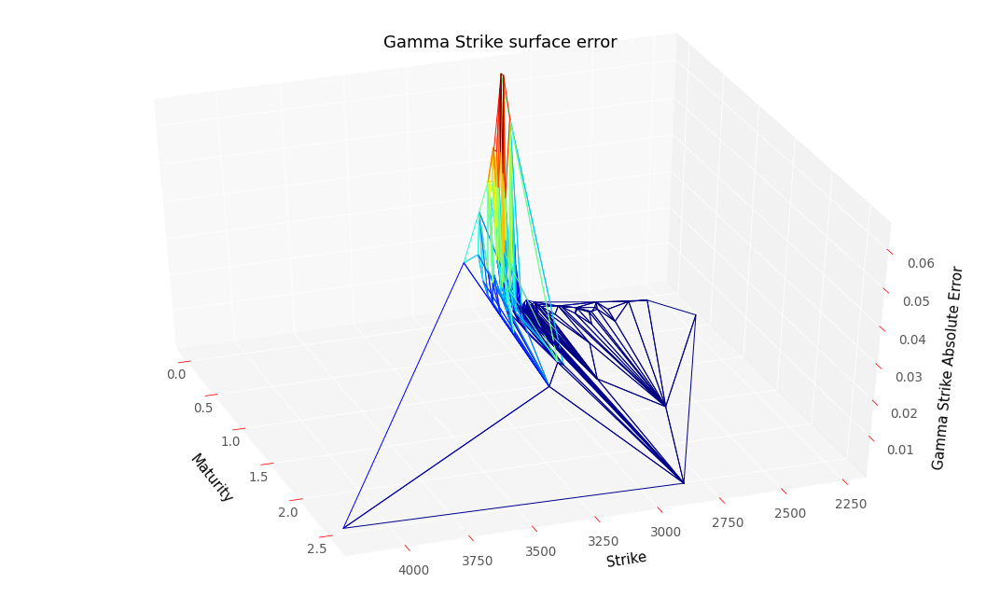

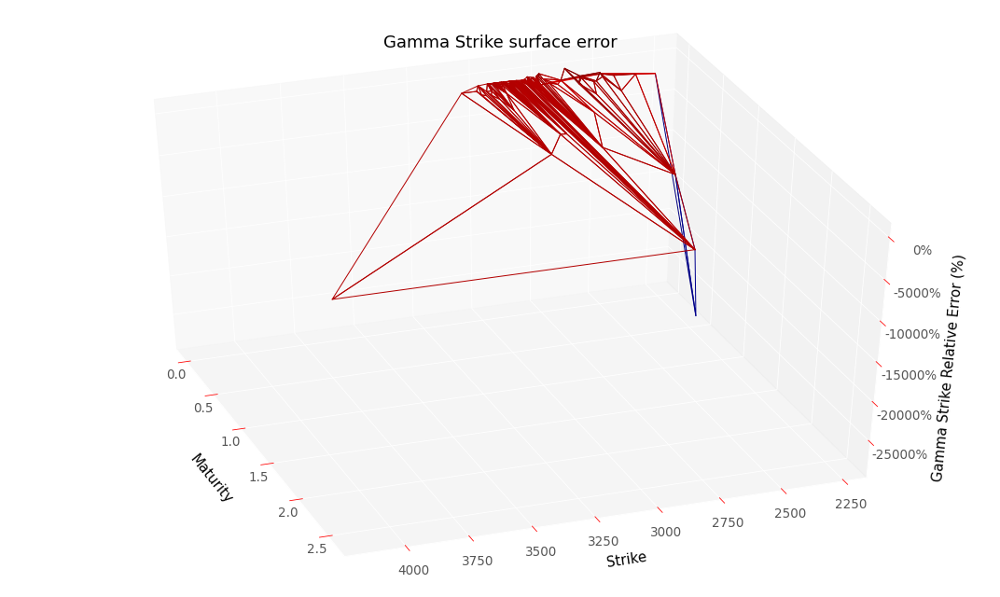

RMSE :  0.018615864736382565
RMSE Relative:  25.056724417555905


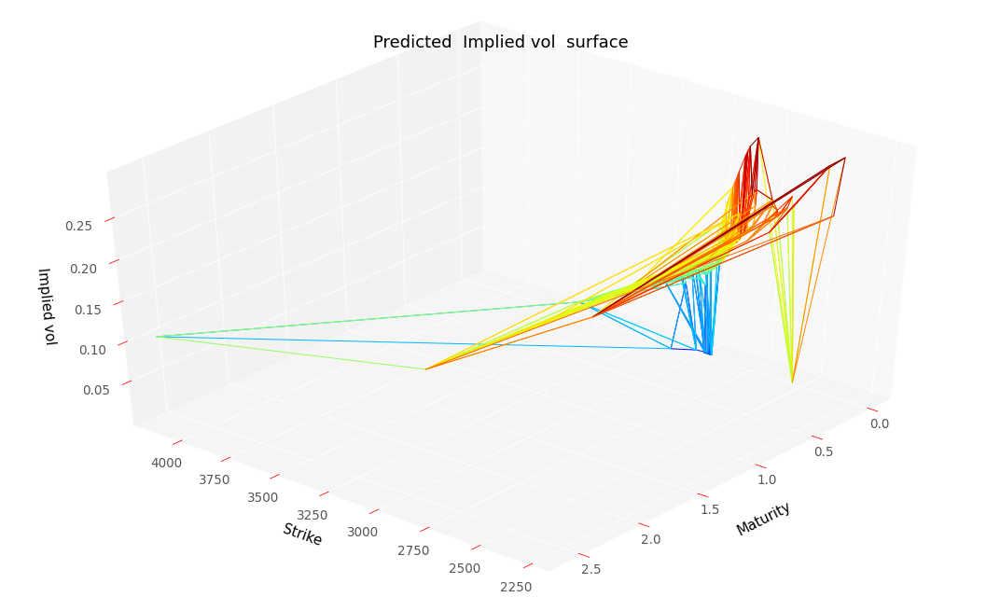

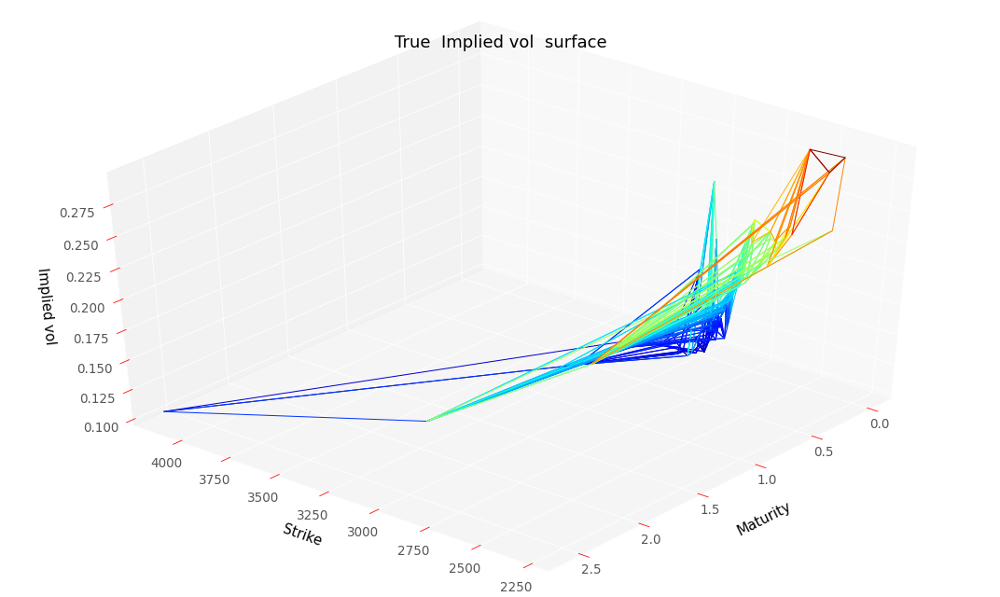

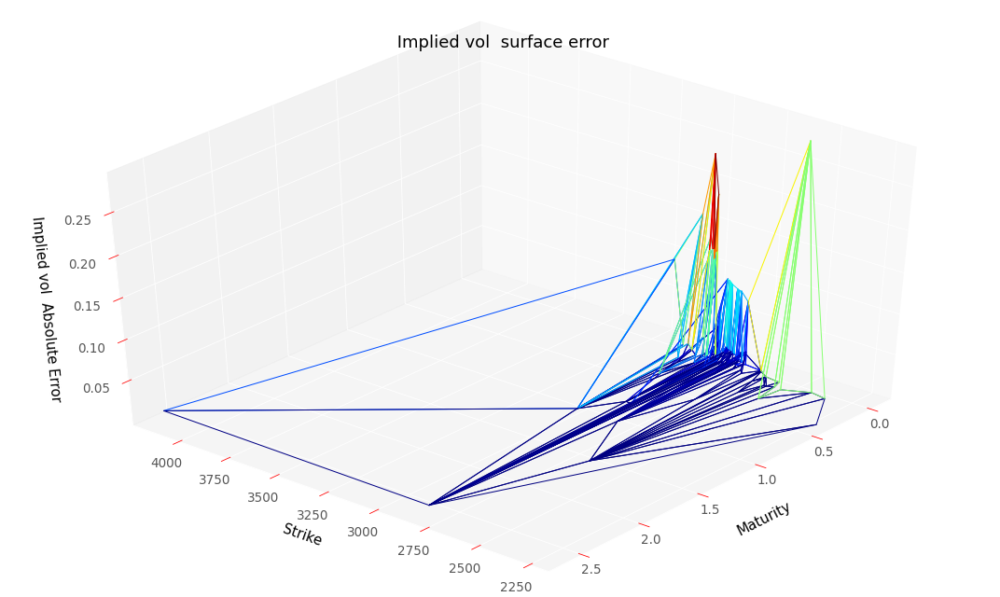

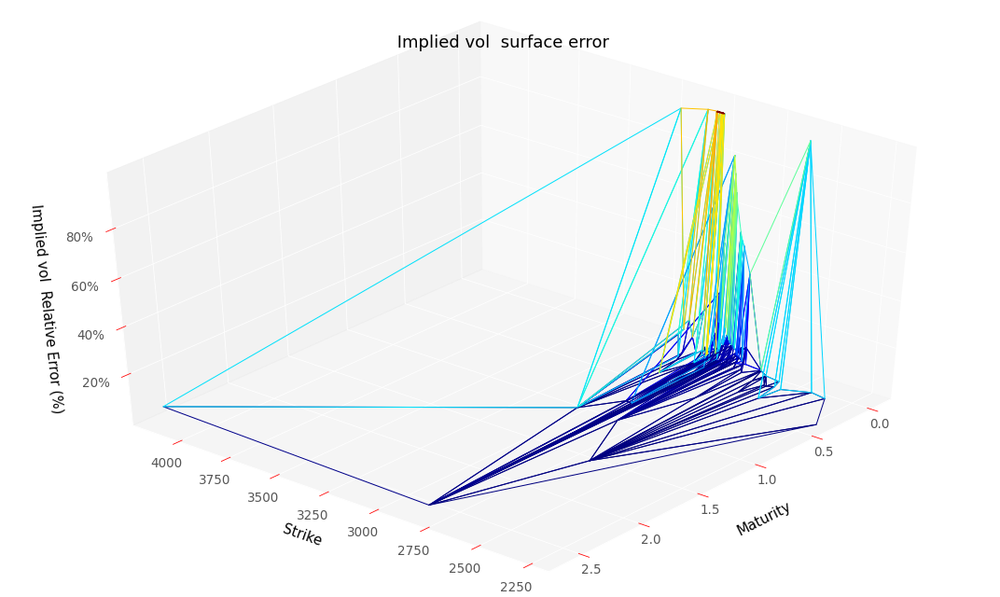

RMSE :  0.05683343936678656
RMSE Relative:  0.3518315802124112


In [62]:
# Evaluate results on the training set, you can execute that cell without training the model
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                      scaledDataSet,
                                      False,
                                      hyperparameters,
                                      scaler,
                                      modelName = "UnconstrainedDupireVolModel")
y_pred, volLocale, dNN_T, gNN_K, lossSerie = res

plotTools.modelSummary(y_pred,
                       volLocale, 
                       dNN_T, 
                       gNN_K, 
                       dataSet,
                       S0,
                       bootstrap,
                       yMin = KMin,
                       yMax = KMax,
                       thresholdPrice = None, 
                       removeNaN = False,
                       savePath = "NeuralUnconstrainedPriceTrain")

In [ ]:
volLocale.loc[(midS0,slice(None))]

Strike  Maturity
2860.0  0.005       0.104423
        0.011       0.111483
        0.036       0.133972
        0.074       0.155001
        0.112       0.170493
        0.285       0.176236
Name: Dupire, dtype: float32

Best loss (hidden nodes: 100, iterations: 0): 0.32
Best Penalization :  [1.3616138, [0.0, 0.0, 0.020829355]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0150096845]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


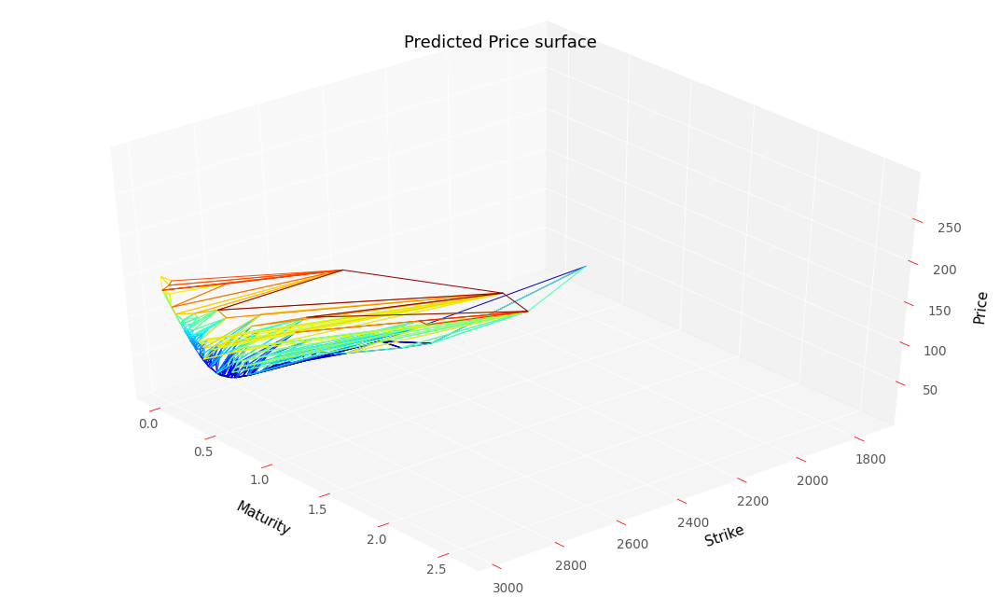

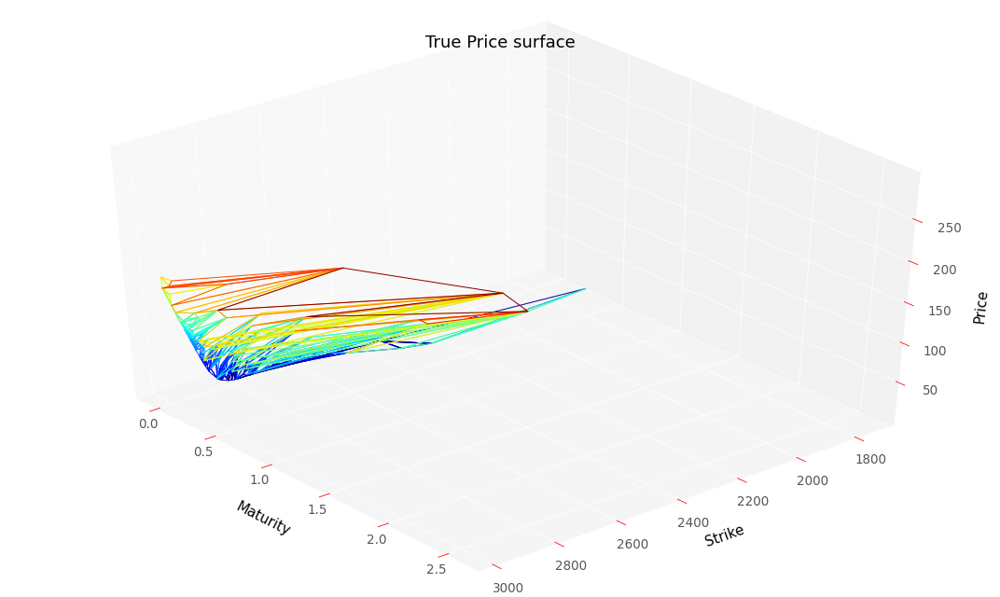

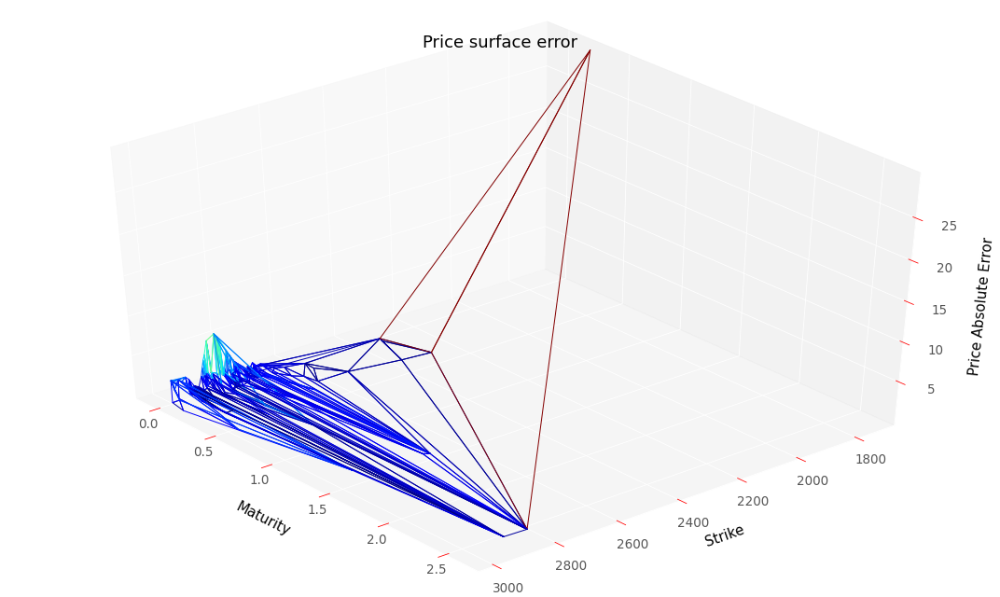

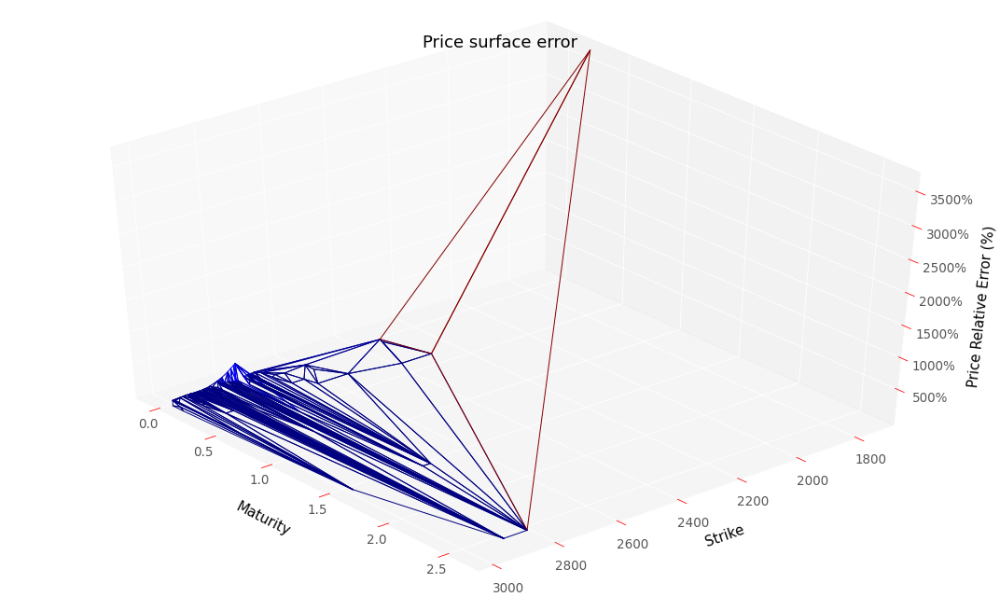

RMSE :  3.0186153885246454
RMSE Relative:  3.1124495378046175


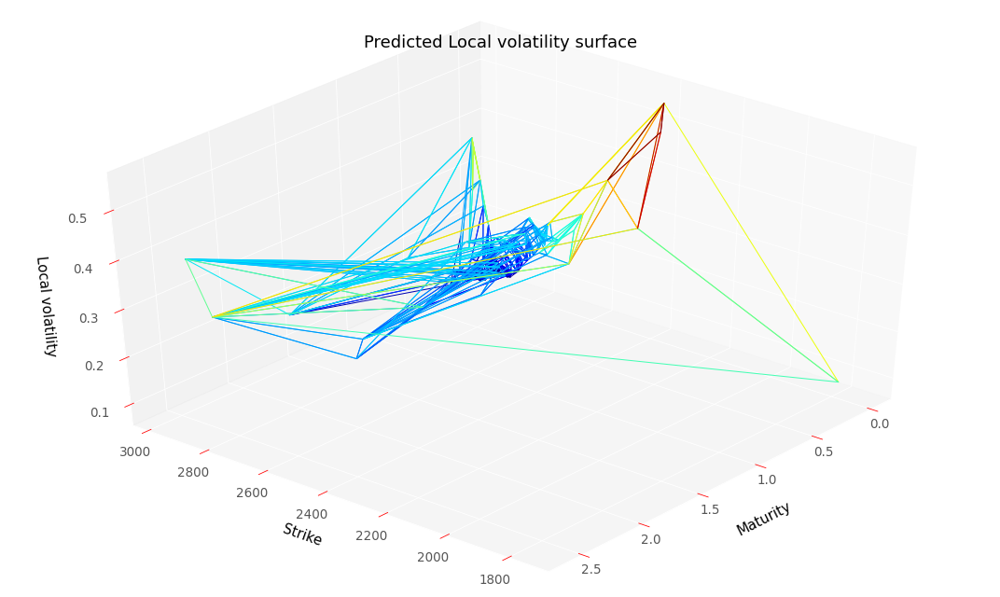

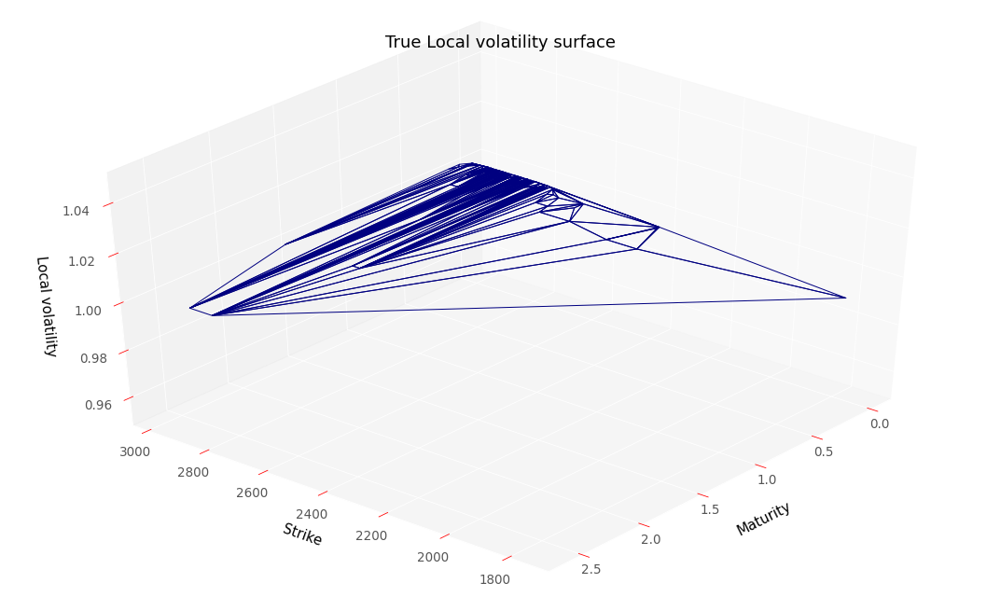

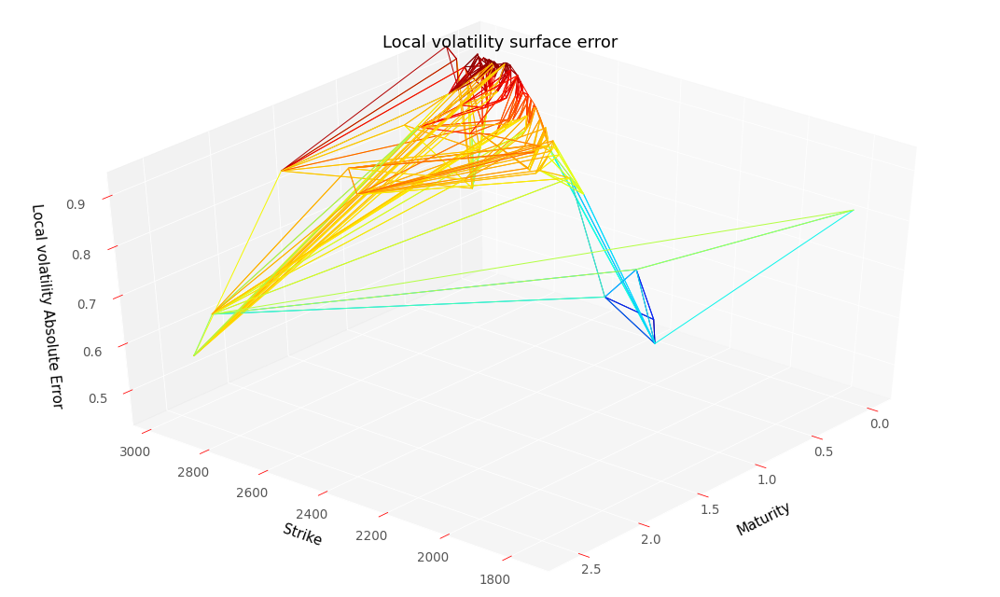

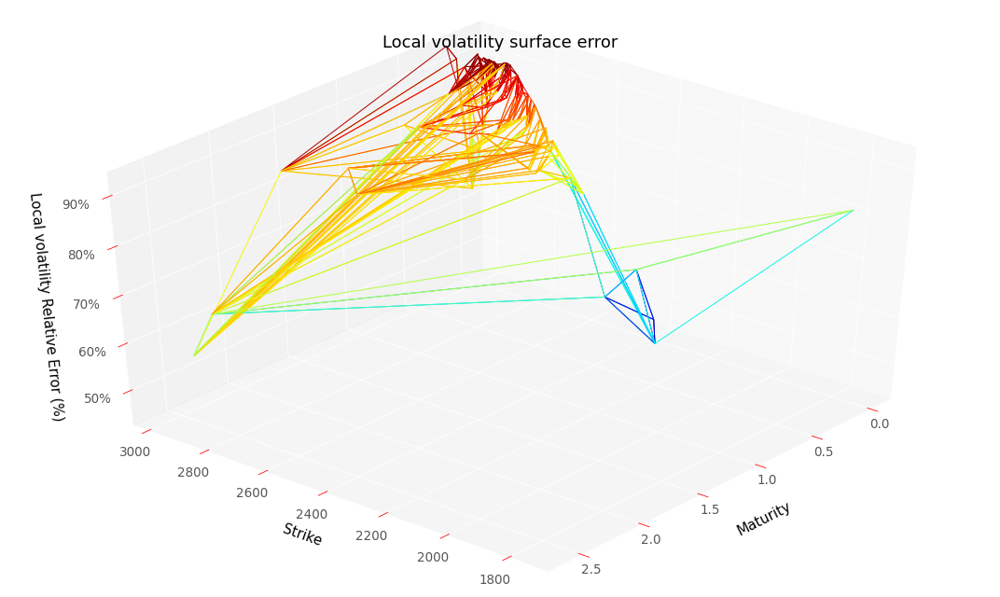

RMSE :  0.8370065986789647
RMSE Relative:  0.8370065986789647


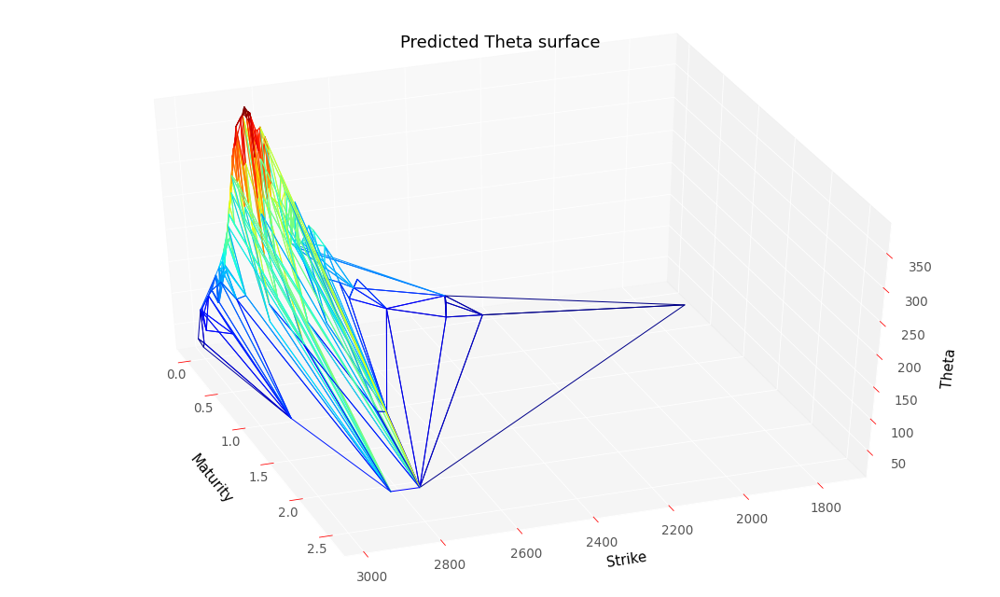

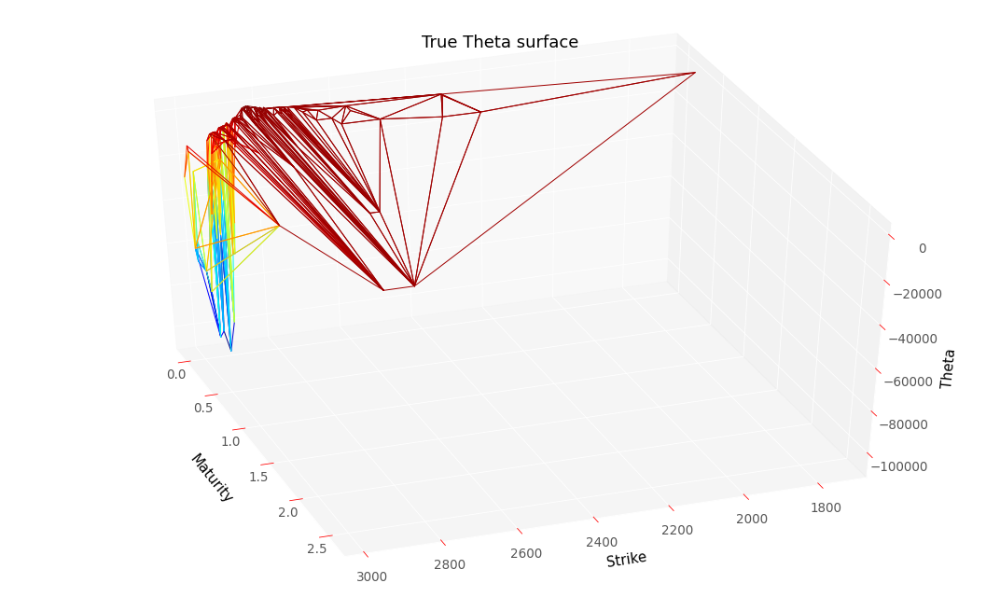

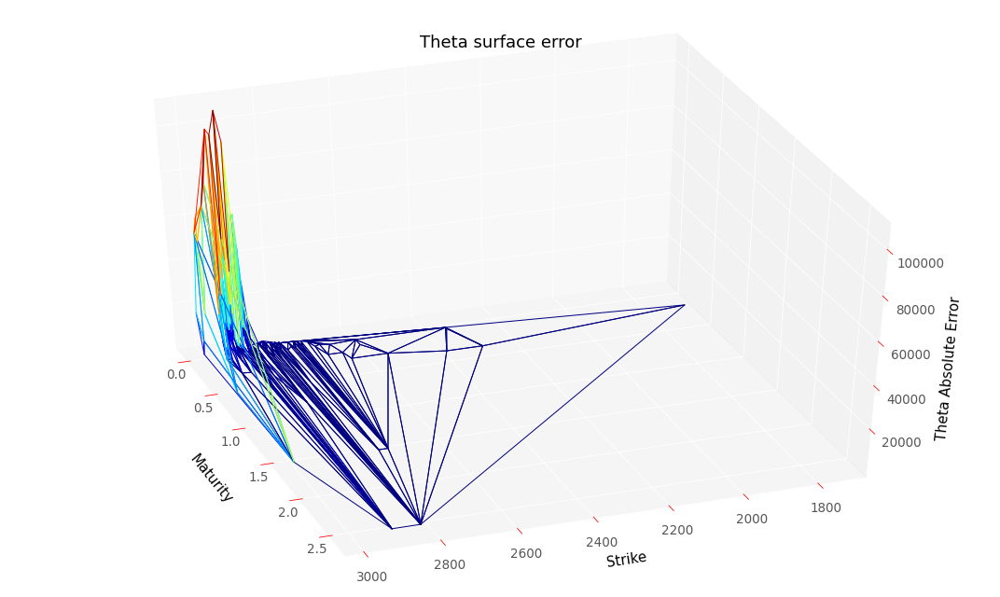

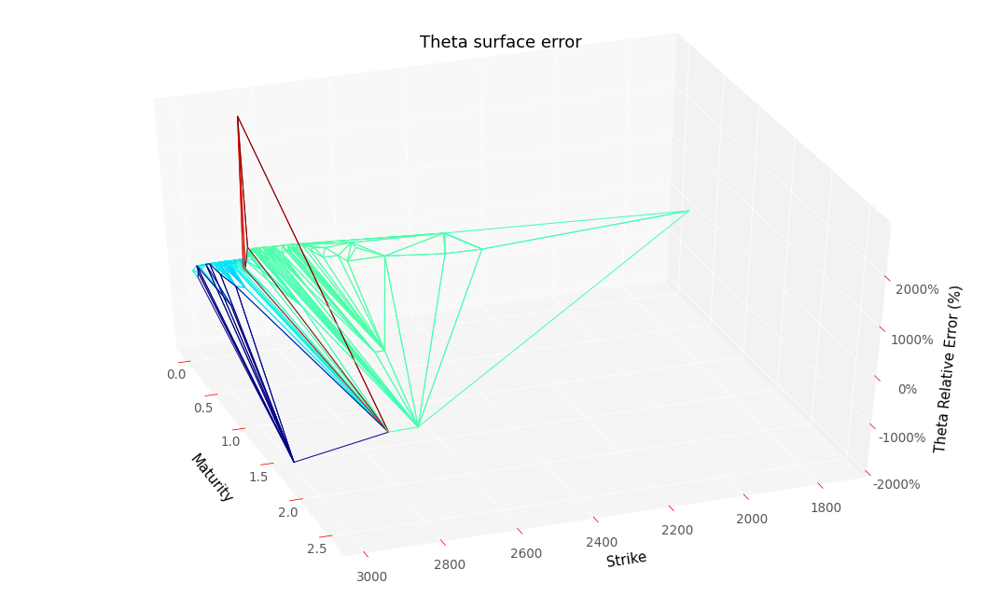

RMSE :  25095.768756147478
RMSE Relative:  3.1044773416762883


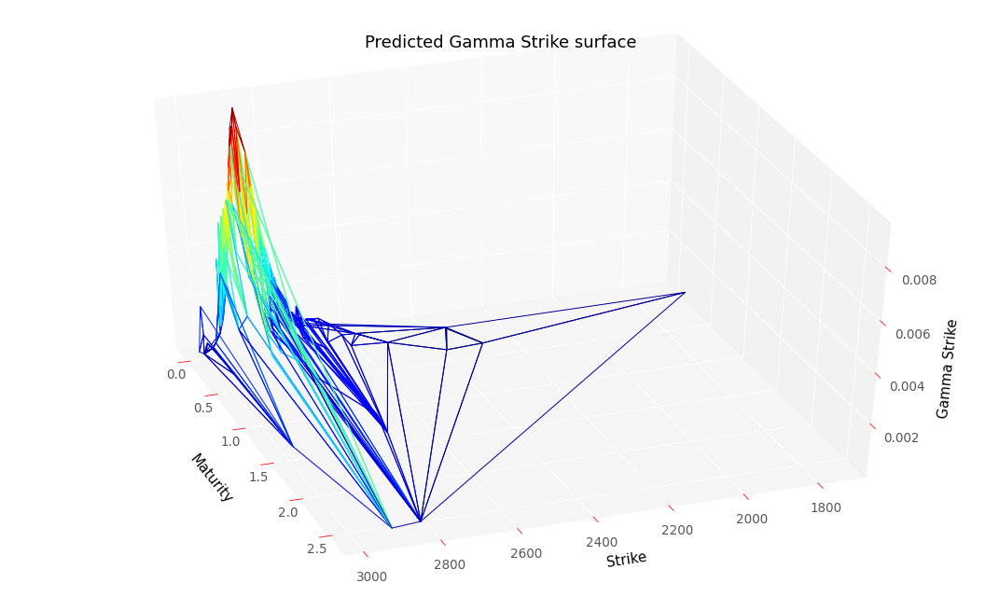

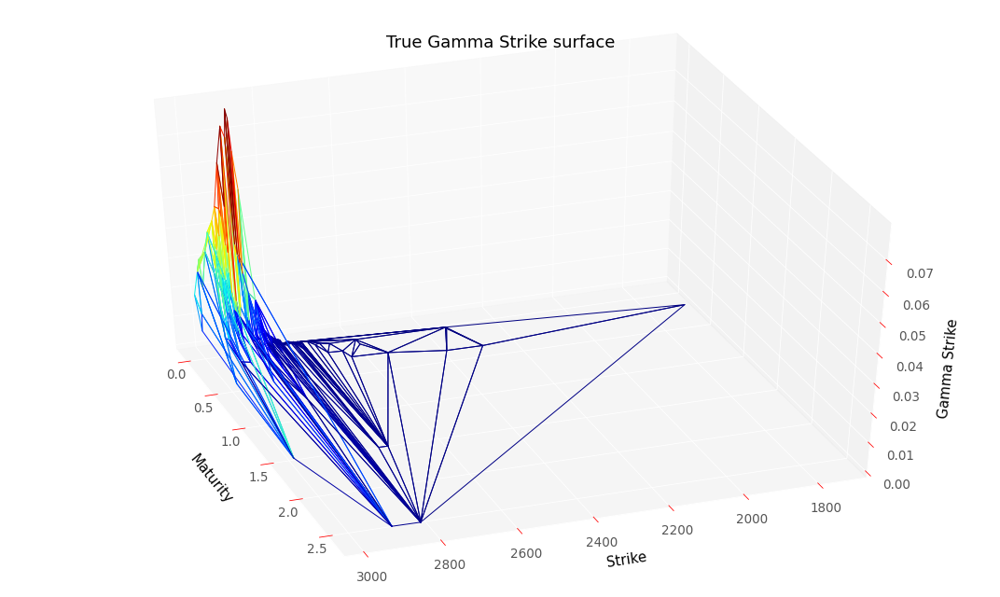

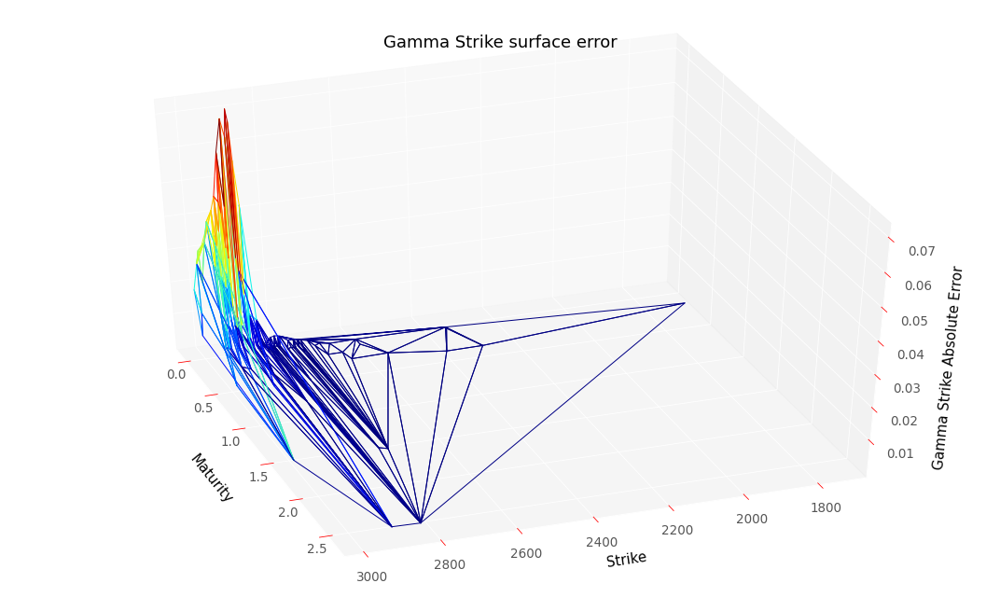

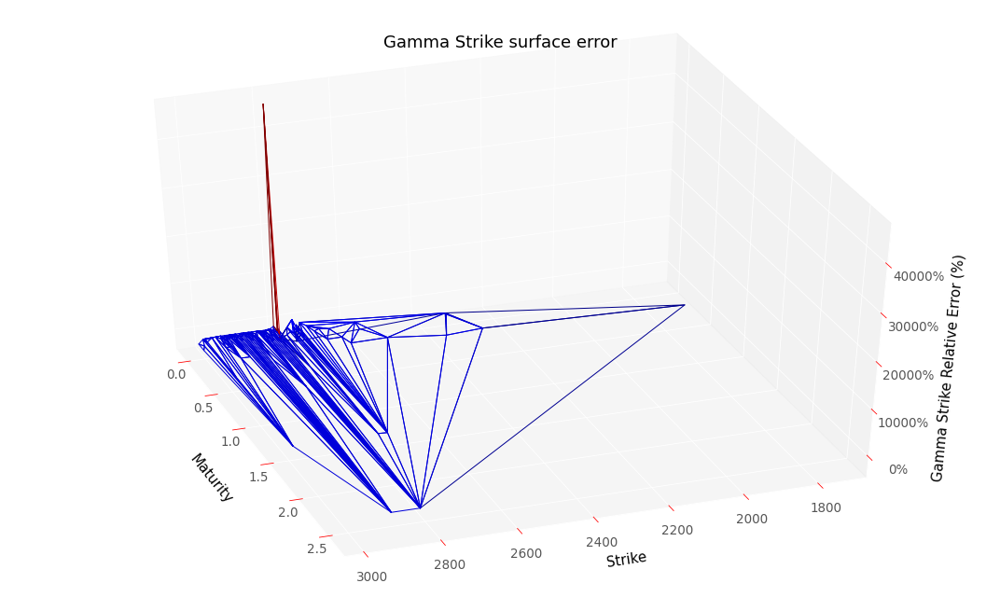

RMSE :  0.020523597954508407
RMSE Relative:  39.42141964677682


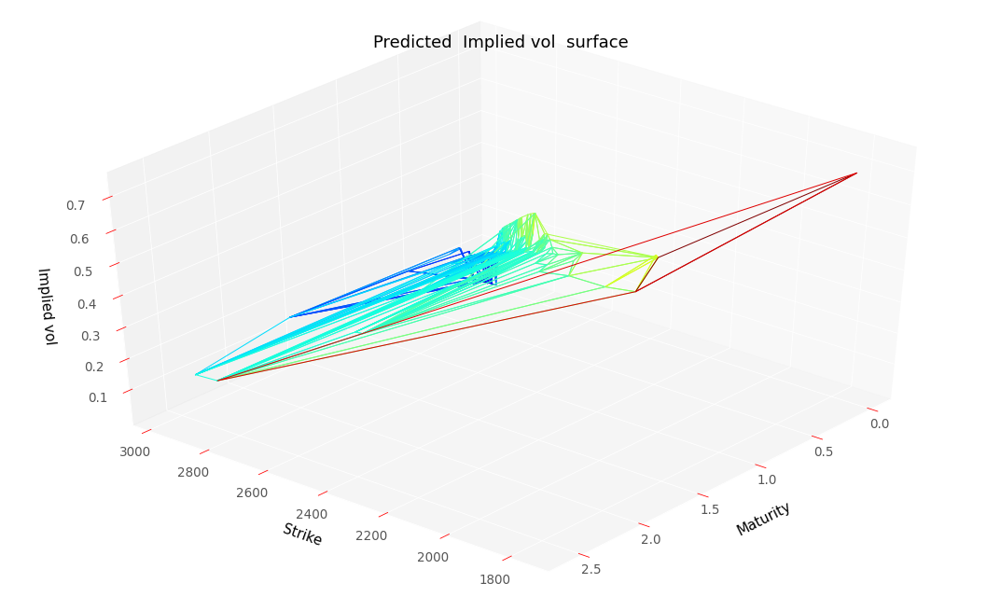

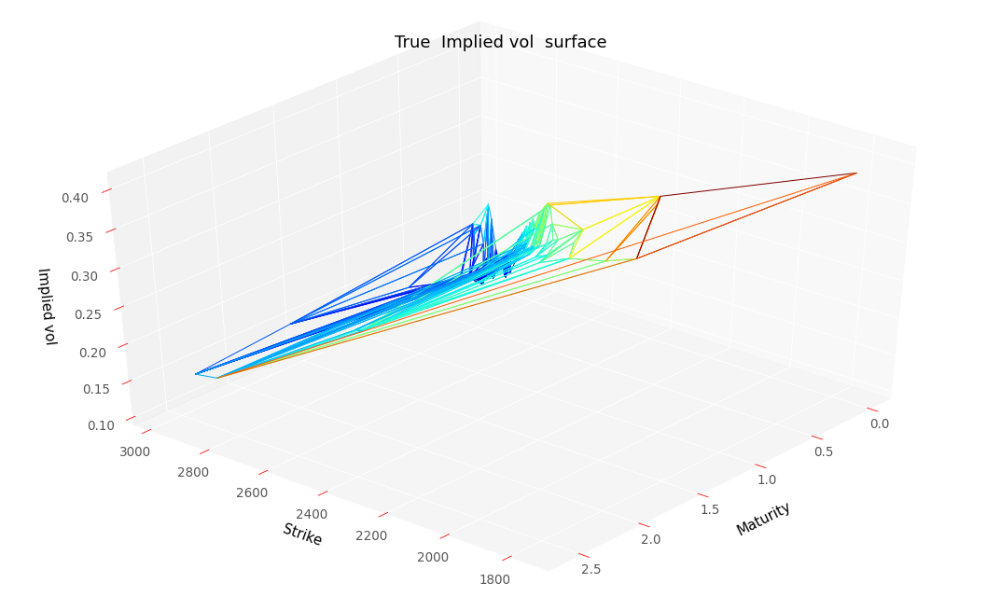

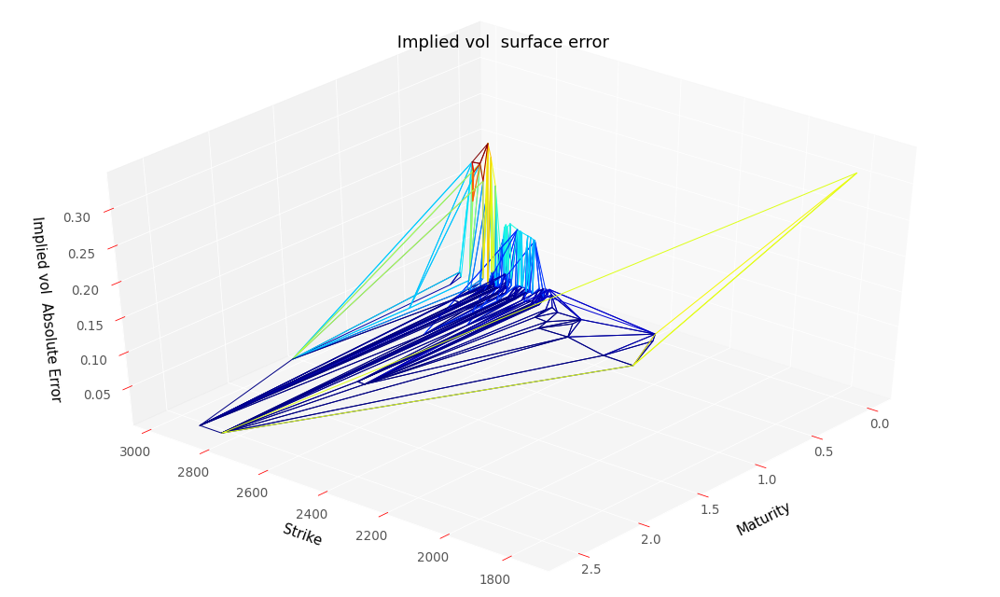

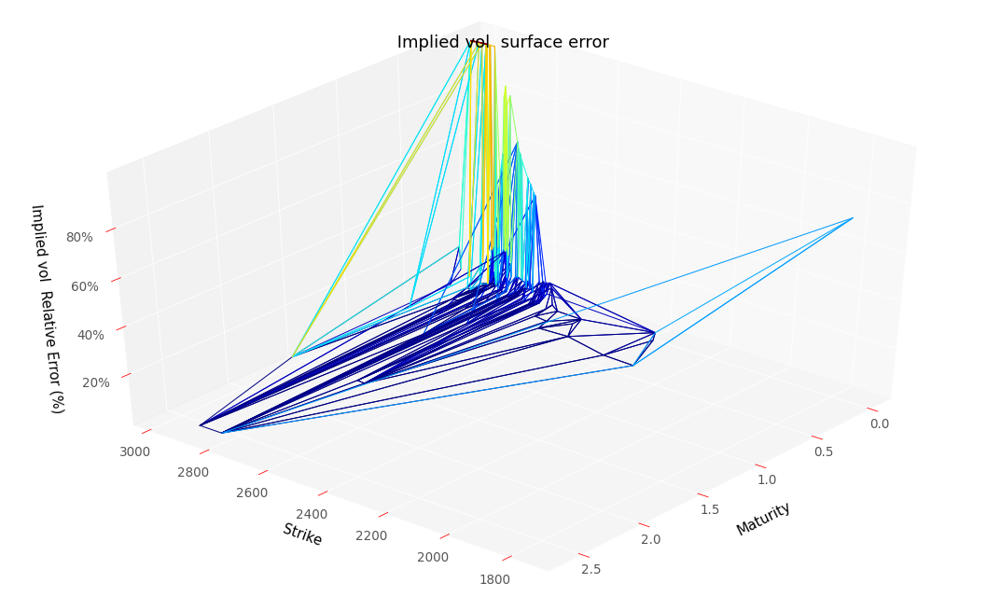

RMSE :  0.058301320419272294
RMSE Relative:  0.33973465003009745


In [63]:
# Evaluate results on the testing dataset, you can execute that cell without training the model
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                      scaledDataSetTest,
                                      False,
                                      hyperparameters,
                                      scaler,
                                      modelName = "UnconstrainedDupireVolModel")
y_predTest, volLocaleTest, dNN_TTest, gNN_KTest, lossSerieTestG = res

plotTools.modelSummary(y_predTest,
                       volLocaleTest,
                       dNN_TTest,
                       gNN_KTest,
                       dataSetTest,
                       S0,
                       bootstrap,
                       yMin = KMin,
                       yMax = KMax,
                       thresholdPrice = None, 
                       removeNaN = False,
                       savePath = "NeuralUnconstrainedPriceTest")

#### With penalization bounds on local variance.

In [ ]:
#Execute this cell if you want to fit neural network with prices
res = neuralNetwork.create_train_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                       scaledDataSet,
                                       True,
                                       hyperparameters,
                                       scaler,
                                       modelName = "regularizedUnconstrainedDupireVolModel")
y_pred2, volLocale2, dNN_T2, gNN_K2, lossSerie2 = res

In [ ]:
plotTools.plotEpochLoss(lossSerie2)
lossSerie.iloc[-1]

In [ ]:
importlib.reload(plotTools)

Best loss (hidden nodes: 100, iterations: 0): 0.15
Best Penalization :  [1.0873228, [0.0, 0.0, 0.079682626]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0150096845]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


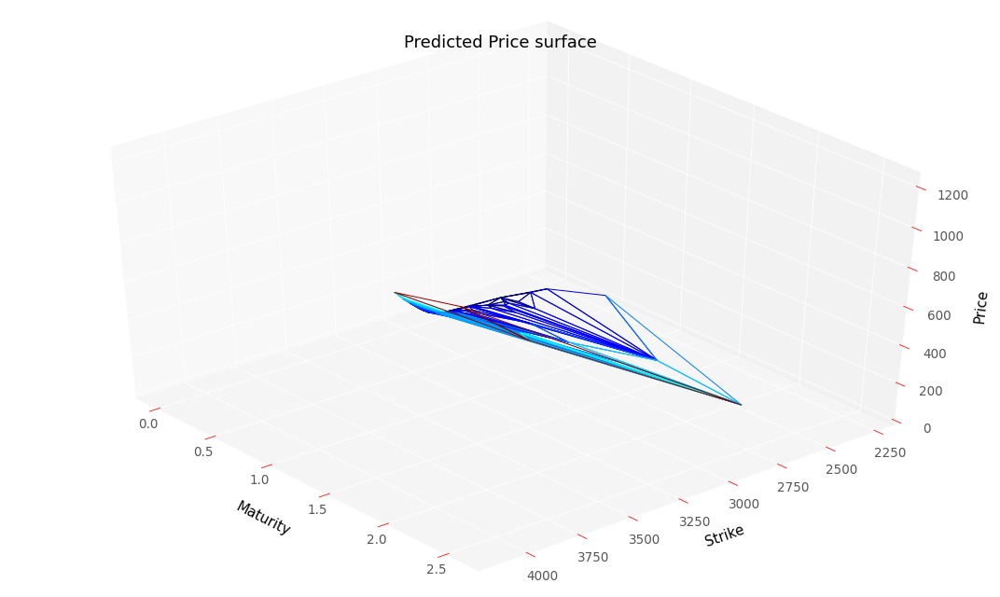

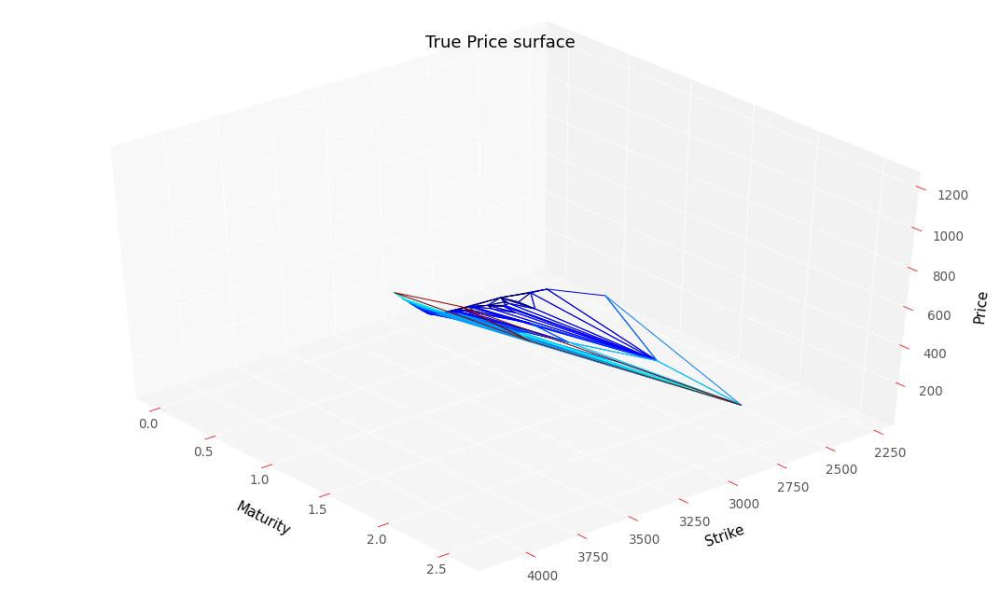

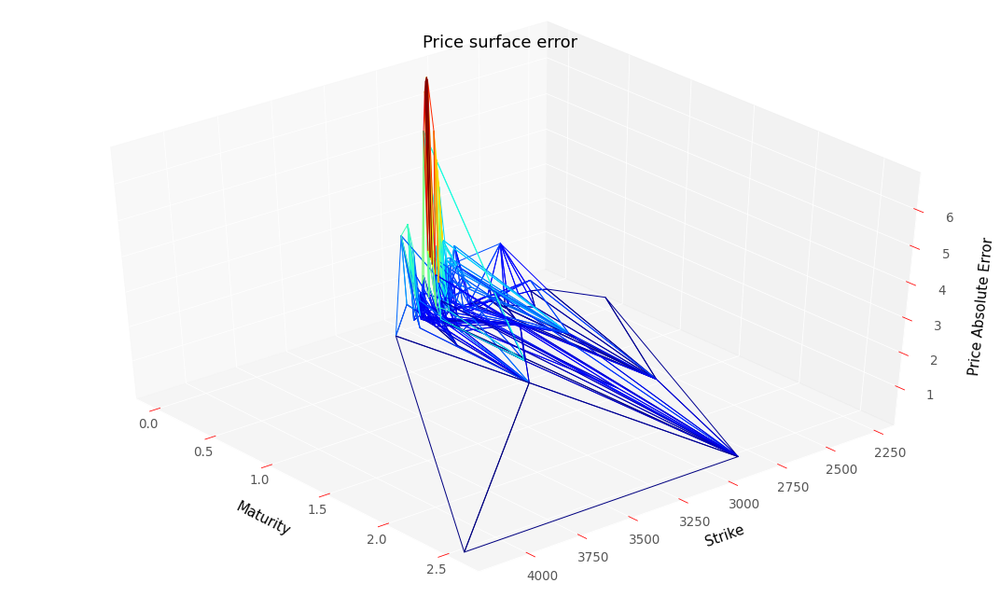

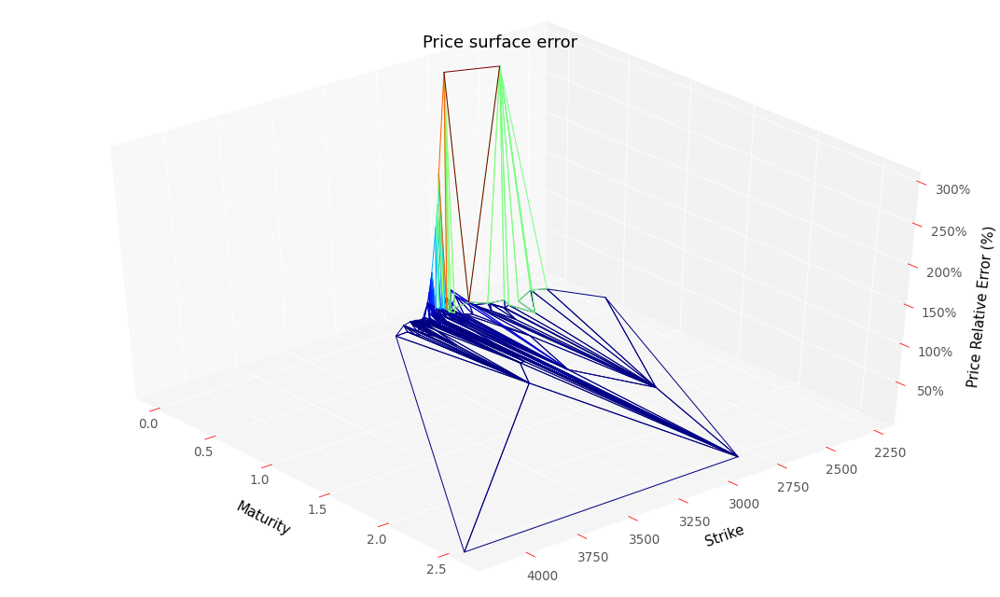

RMSE :  1.7959547062460604
RMSE Relative:  0.45367323643384


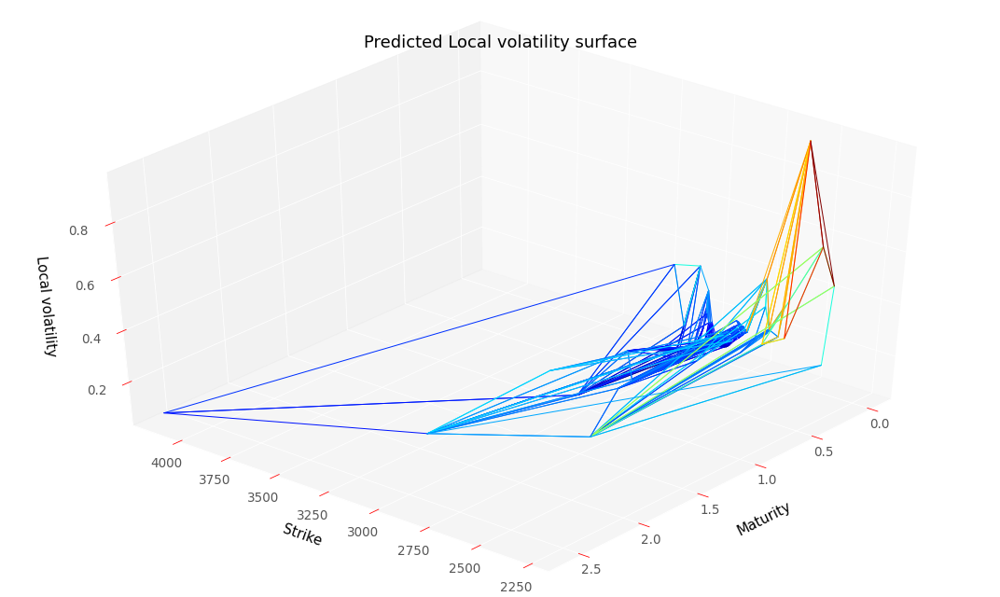

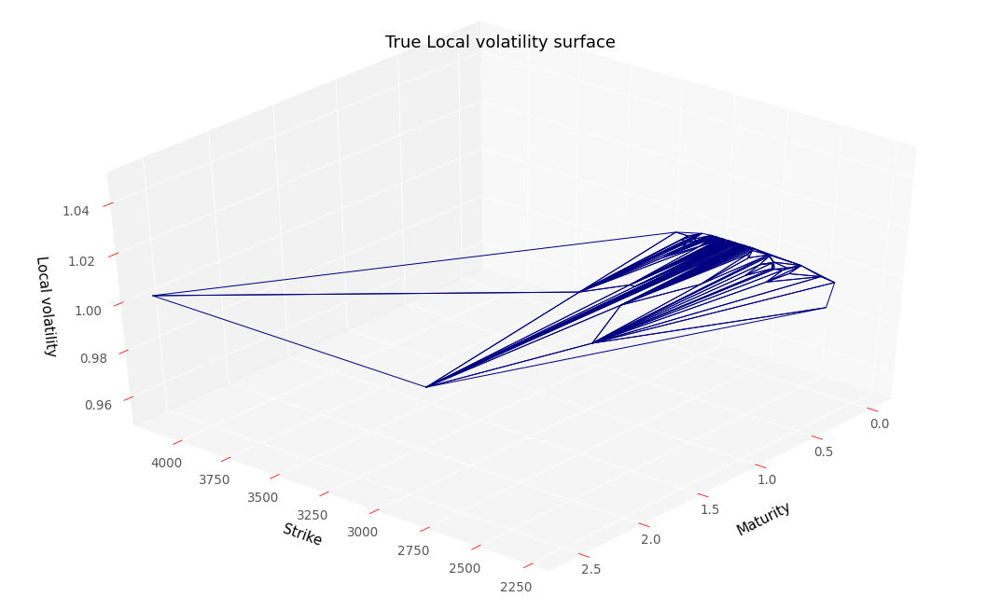

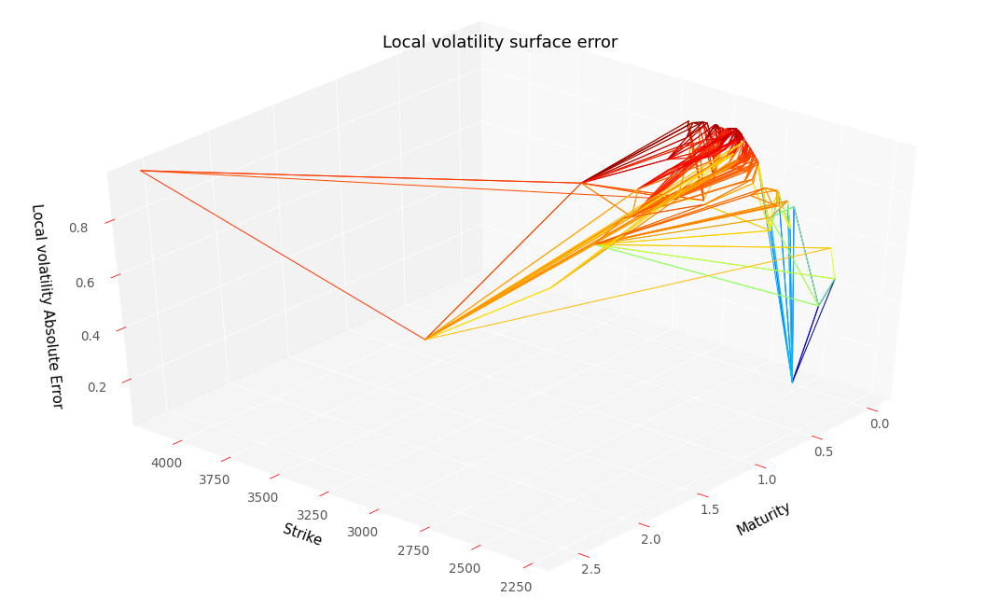

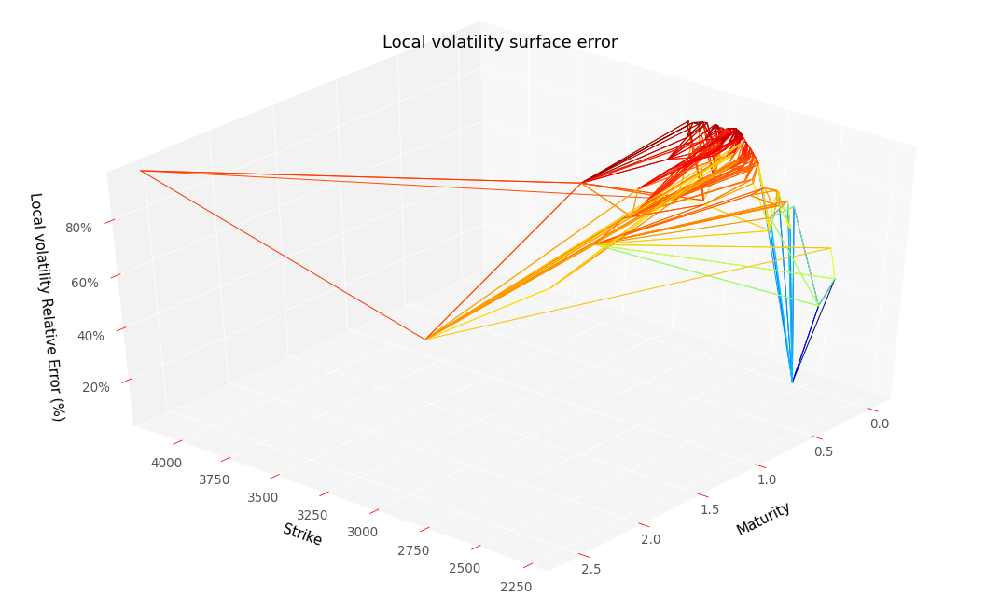

RMSE :  0.8351467723105762
RMSE Relative:  0.8351467723105762


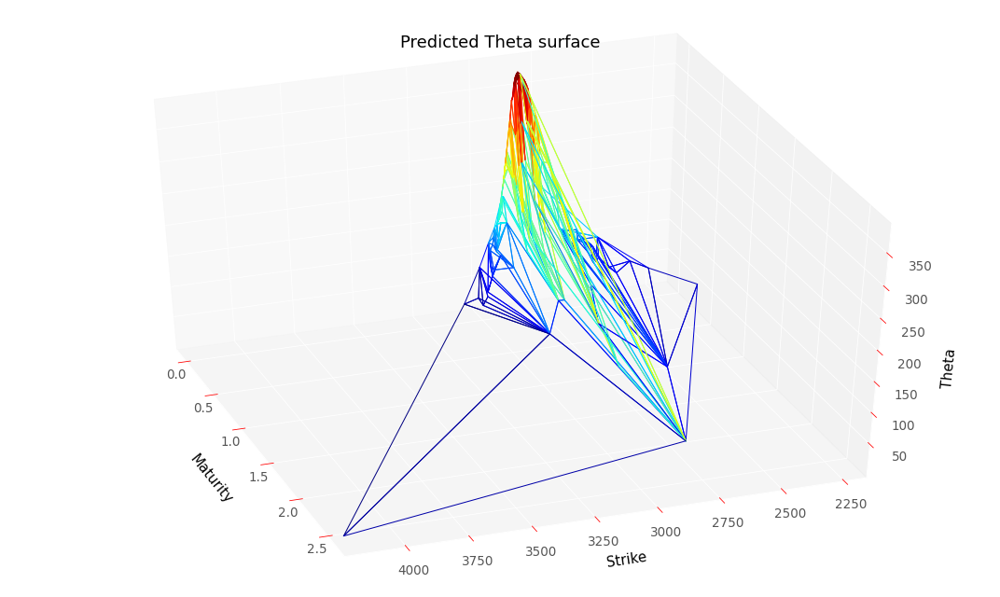

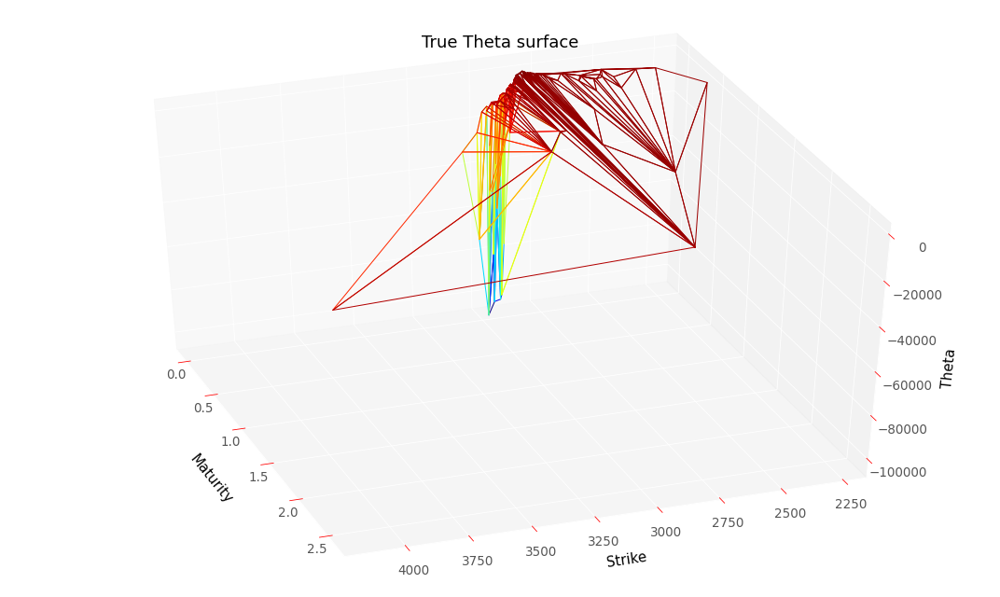

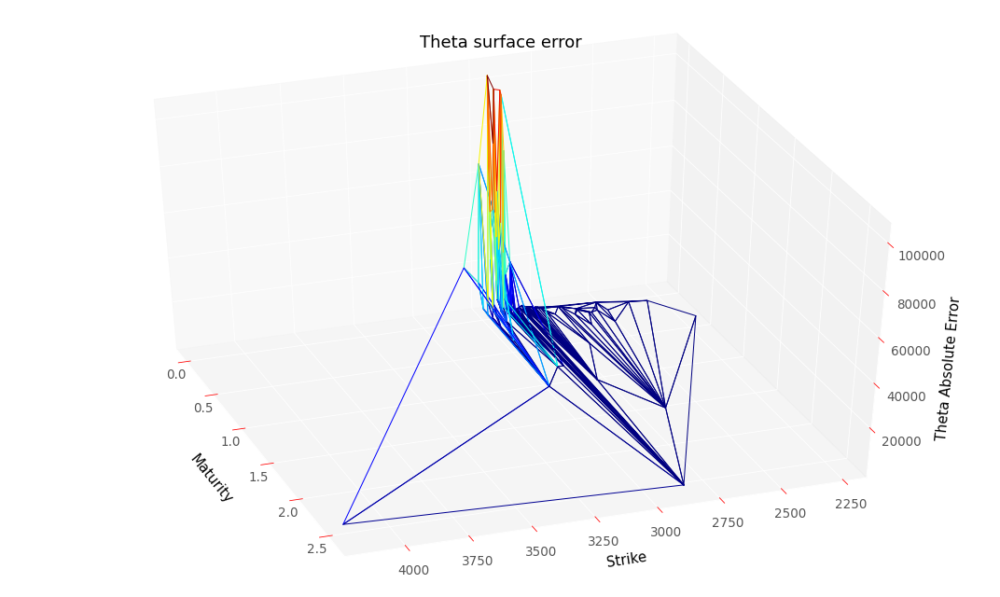

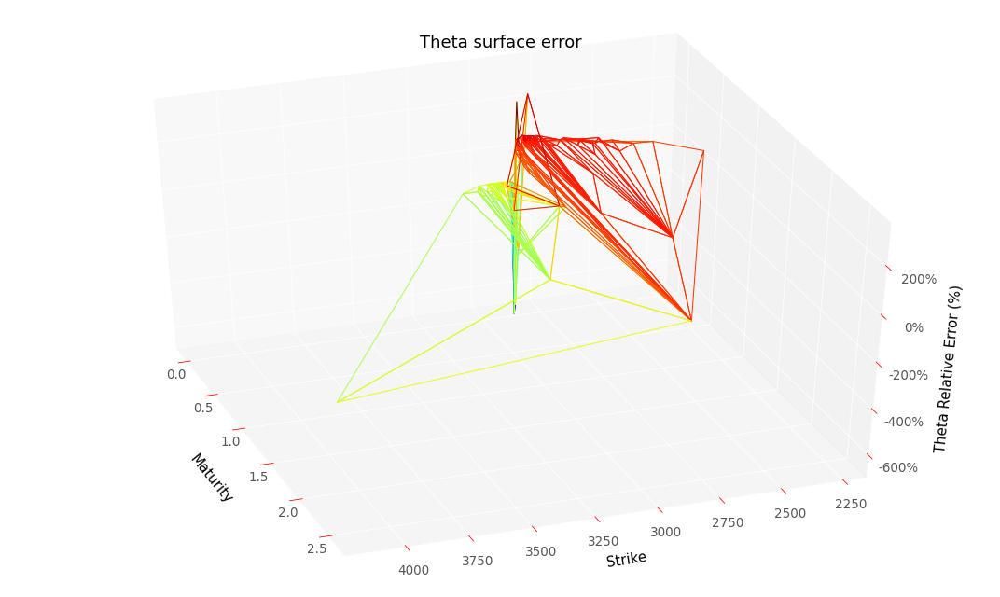

RMSE :  24457.9885565252
RMSE Relative:  1.307153546454654


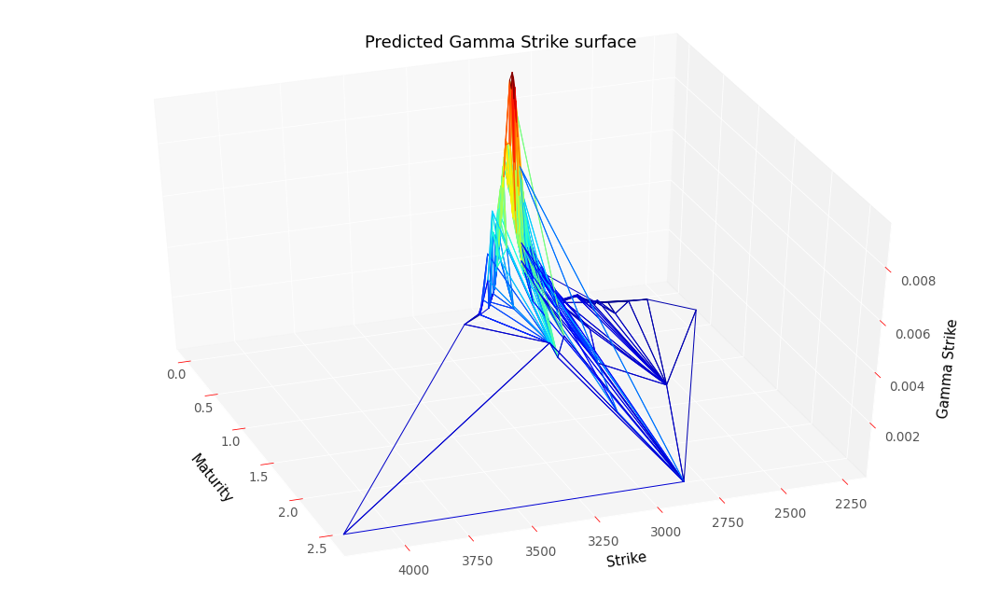

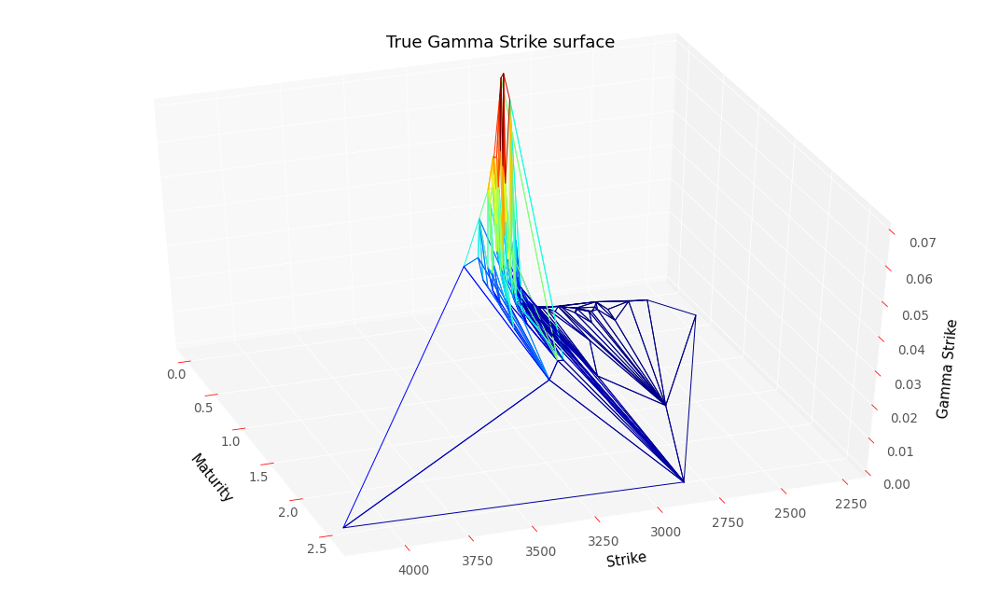

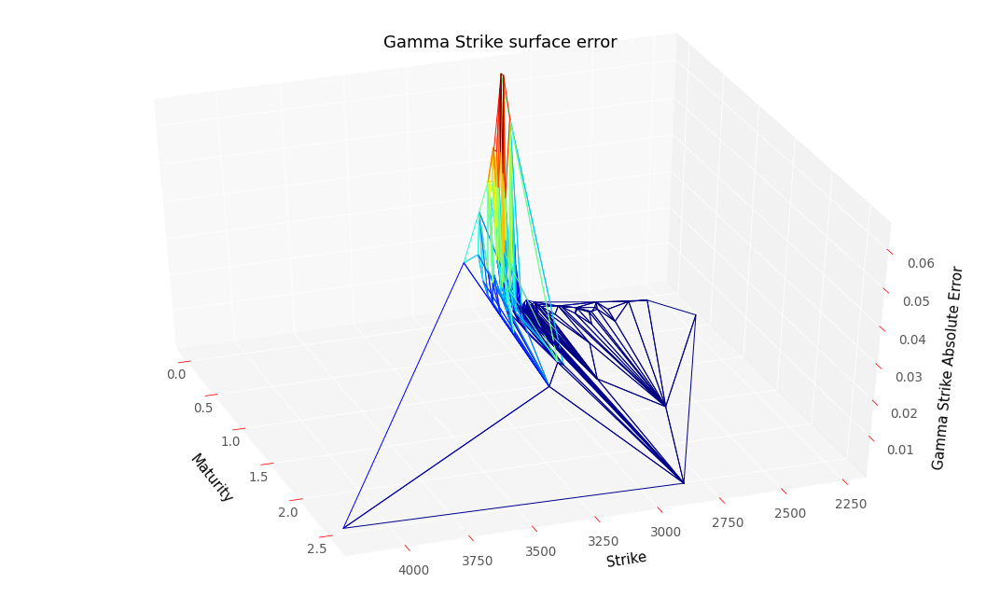

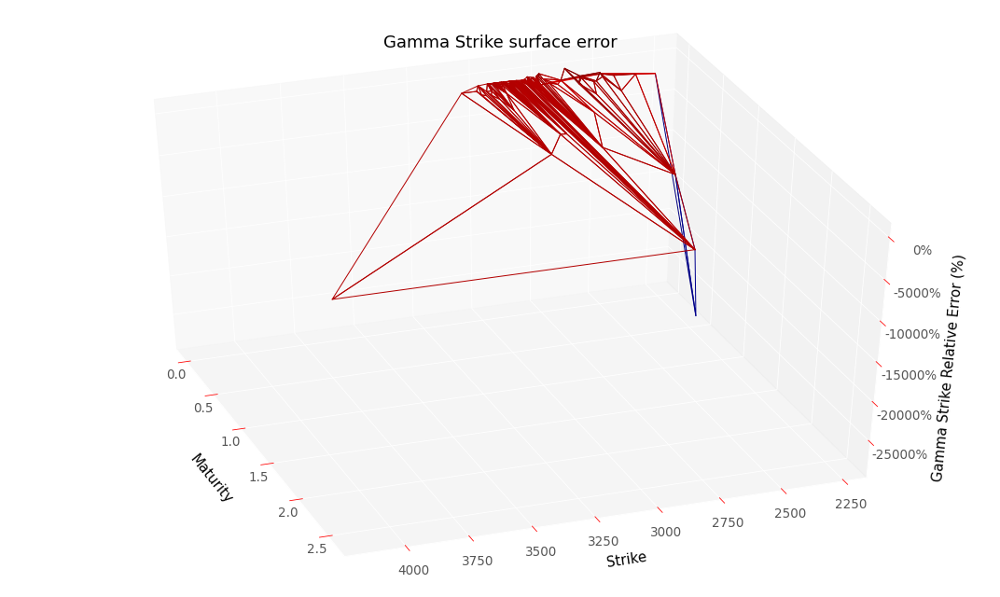

RMSE :  0.018615864736382565
RMSE Relative:  25.056724417555905


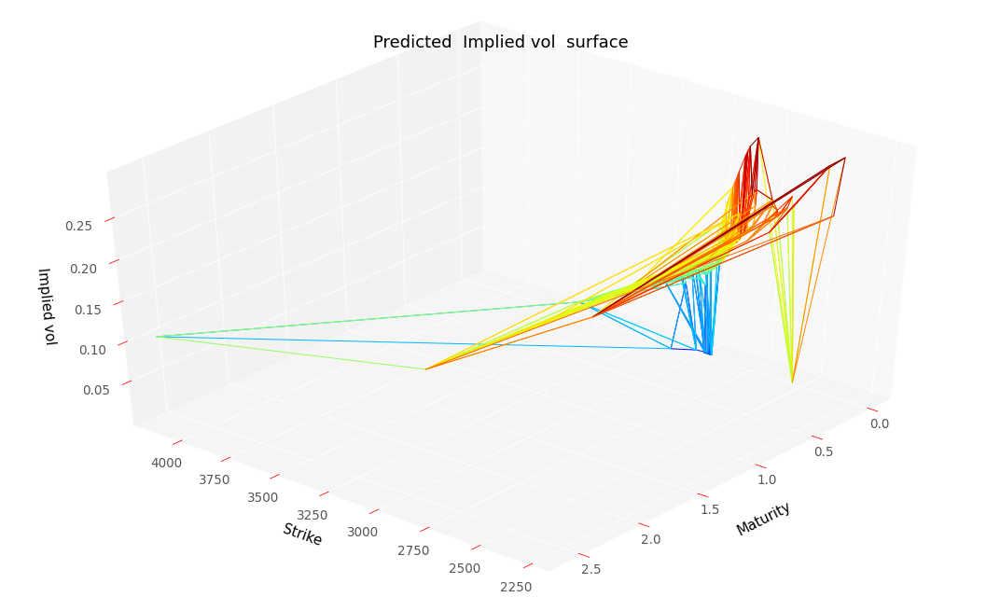

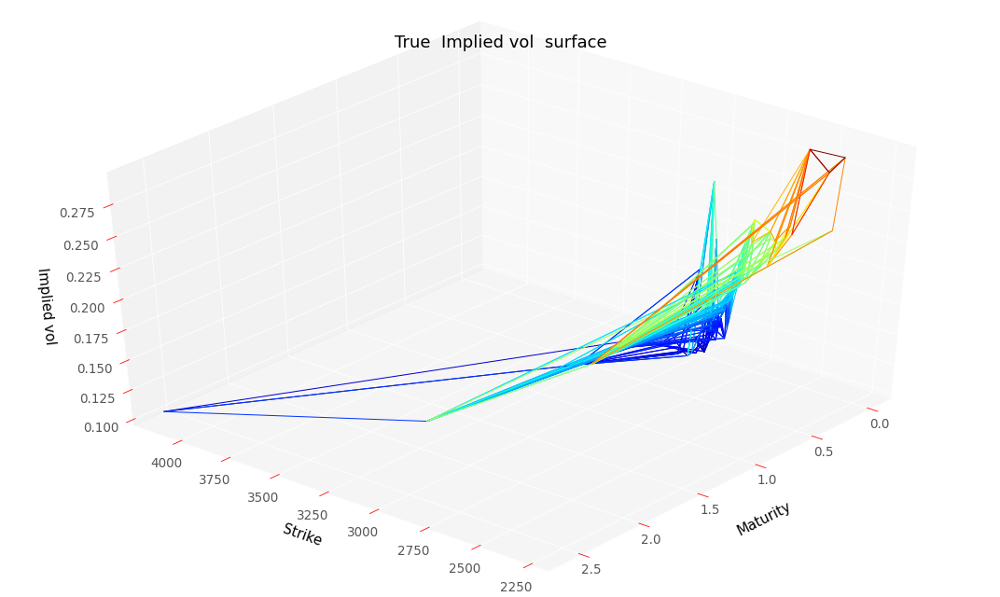

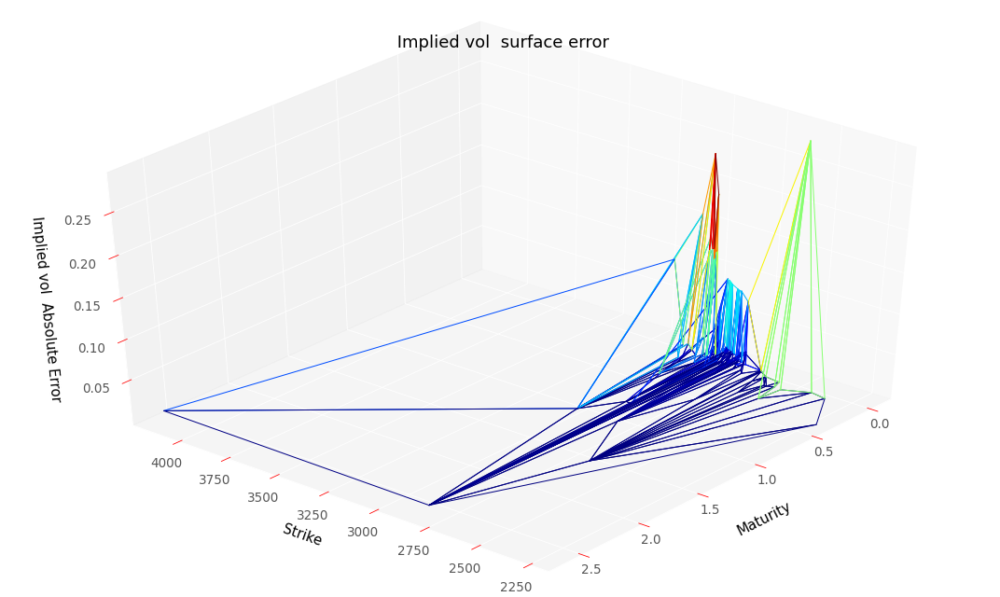

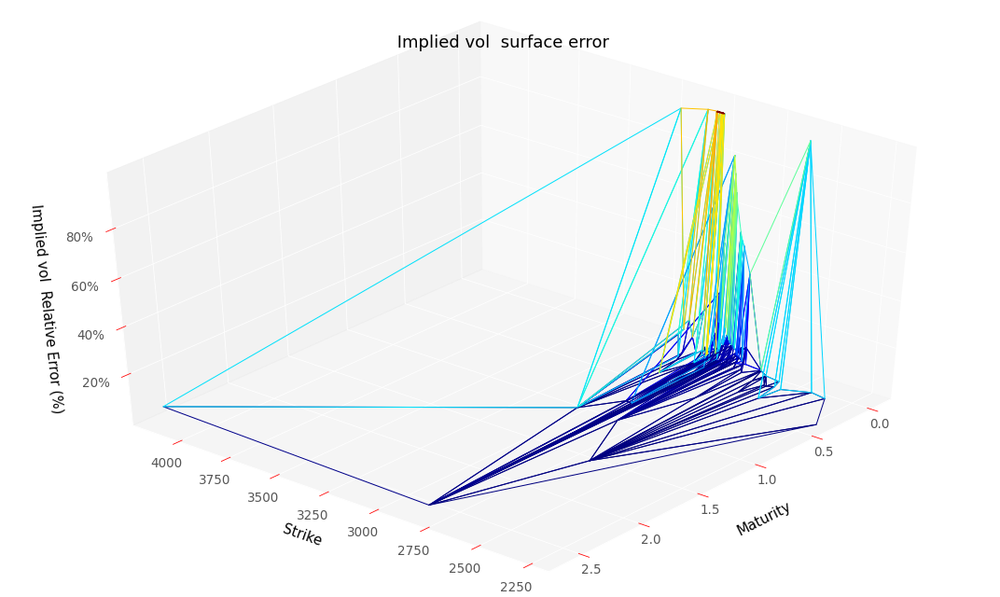

RMSE :  0.05683343936678656
RMSE Relative:  0.3518315802124112


In [62]:
# Evaluate results on the training set, you can execute that cell without training the model
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                      scaledDataSet,
                                      True,
                                      hyperparameters,
                                      scaler,
                                      modelName = "regularizedUnconstrainedDupireVolModel")
y_pred2, volLocale2, dNN_T2, gNN_K2, lossSerie2 = res

plotTools.modelSummary(y_pred2,
                       volLocale2, 
                       dNN_T2, 
                       gNN_K2, 
                       dataSet,
                       S0,
                       bootstrap,
                       yMin = KMin,
                       yMax = KMax,
                       thresholdPrice = None, 
                       removeNaN = False,
                       savePath = "NeuralRegularizedUnconstrainedPriceTrain")

In [ ]:
volLocale2.loc[(midS0,slice(None))]

Strike  Maturity
2860.0  0.005       0.104423
        0.011       0.111483
        0.036       0.133972
        0.074       0.155001
        0.112       0.170493
        0.285       0.176236
Name: Dupire, dtype: float32

Best loss (hidden nodes: 100, iterations: 0): 0.32
Best Penalization :  [1.3616138, [0.0, 0.0, 0.020829355]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0150096845]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


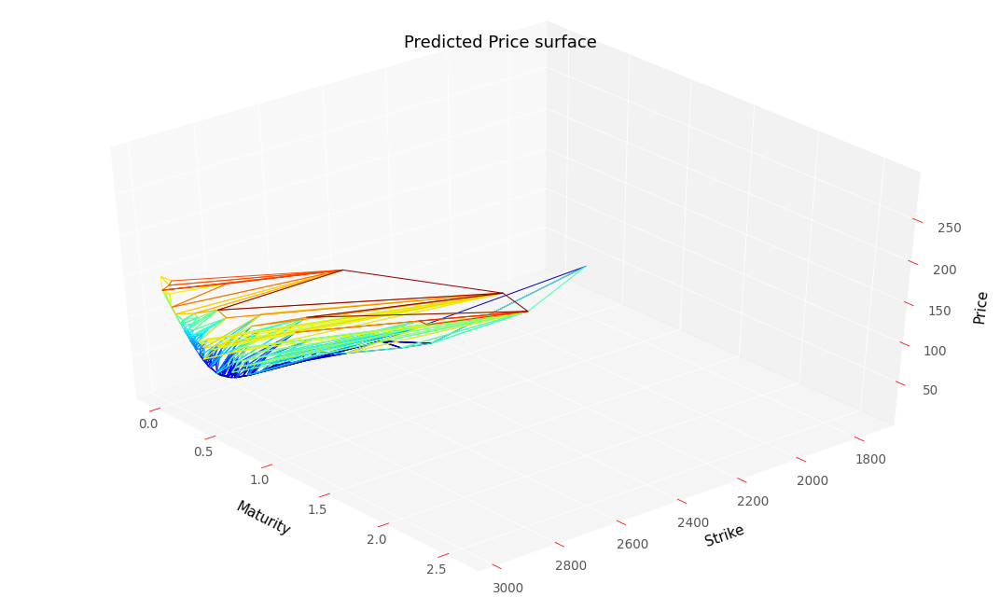

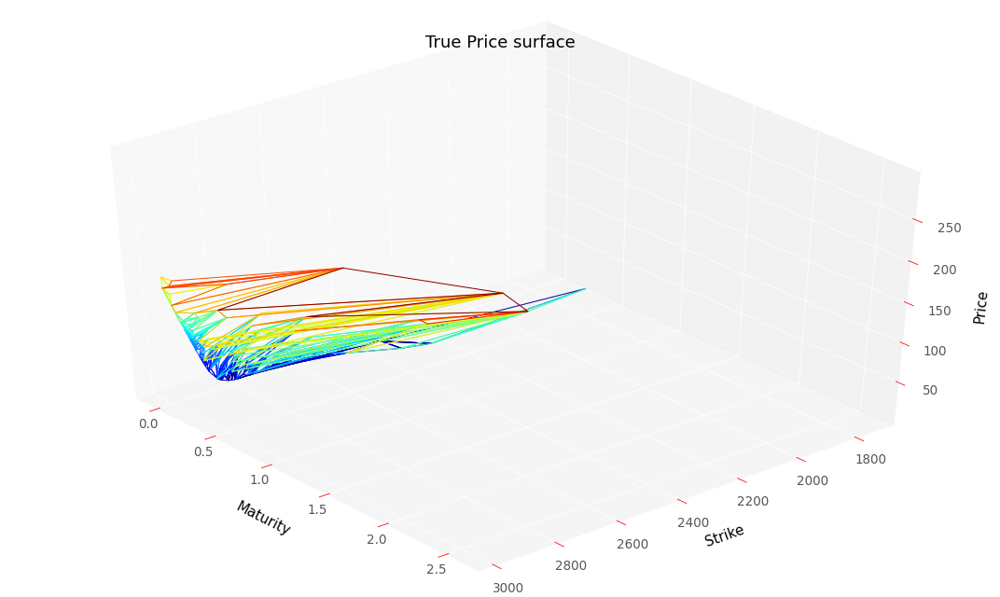

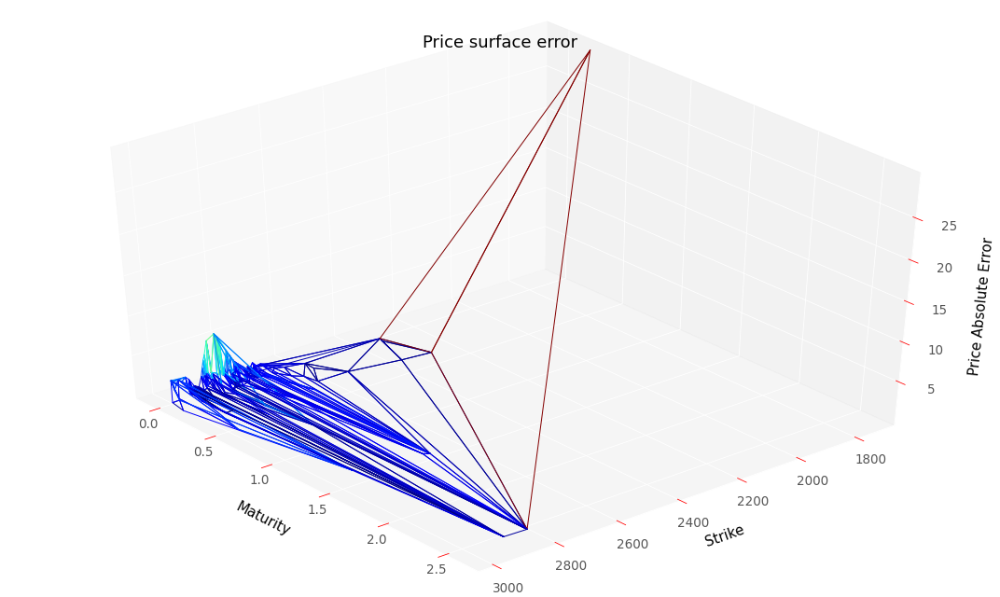

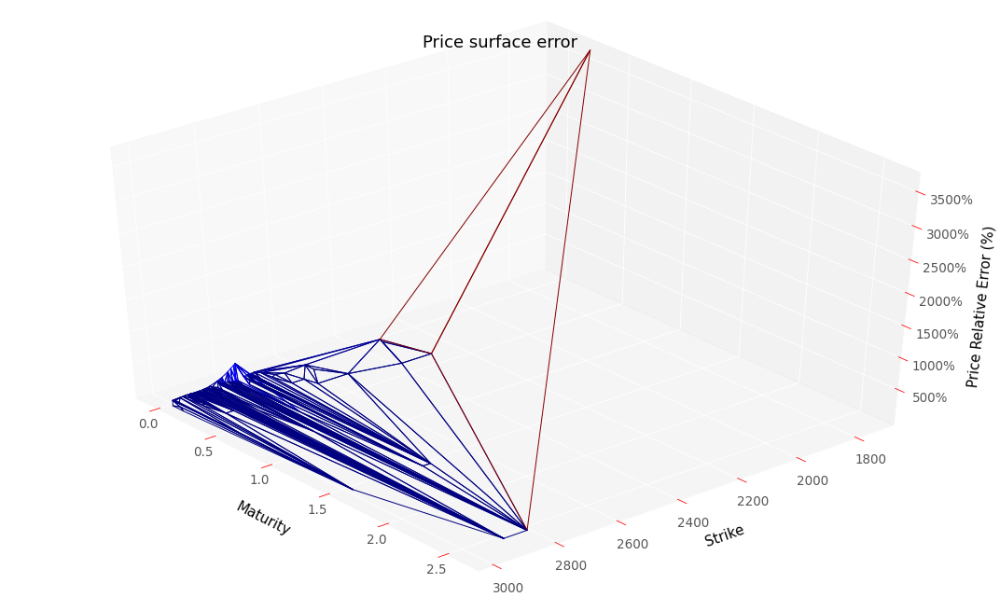

RMSE :  3.0186153885246454
RMSE Relative:  3.1124495378046175


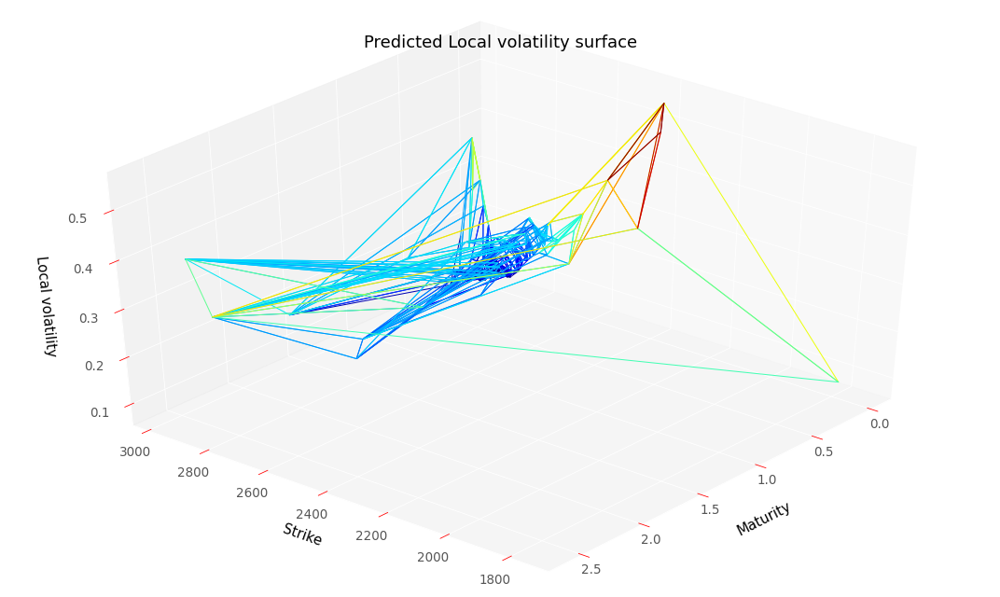

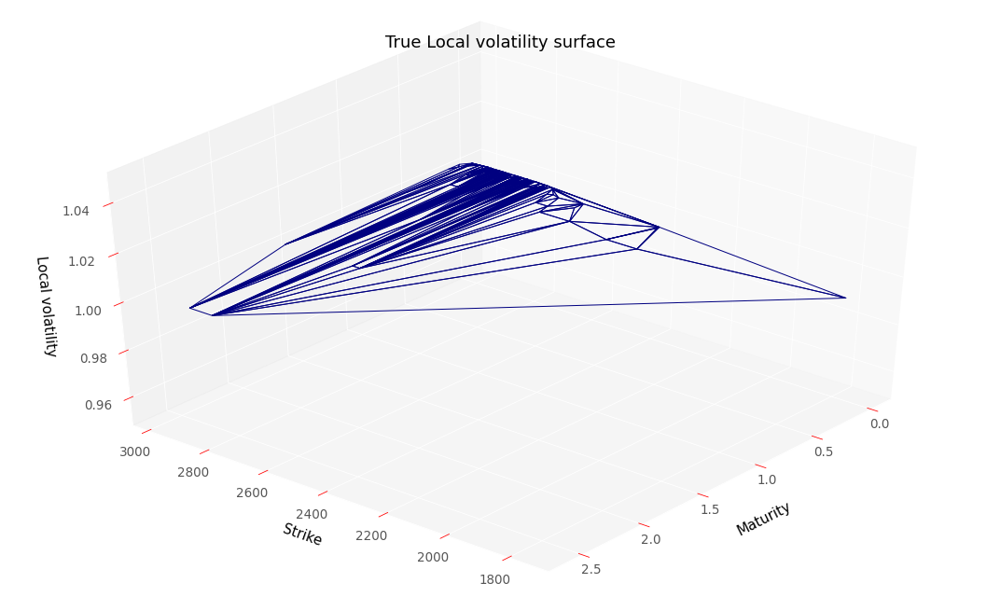

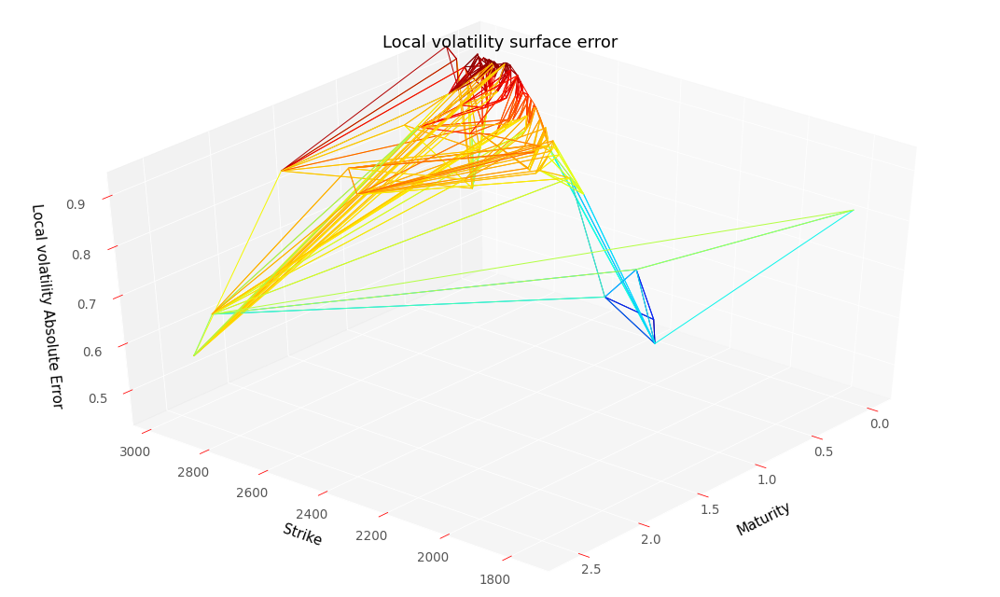

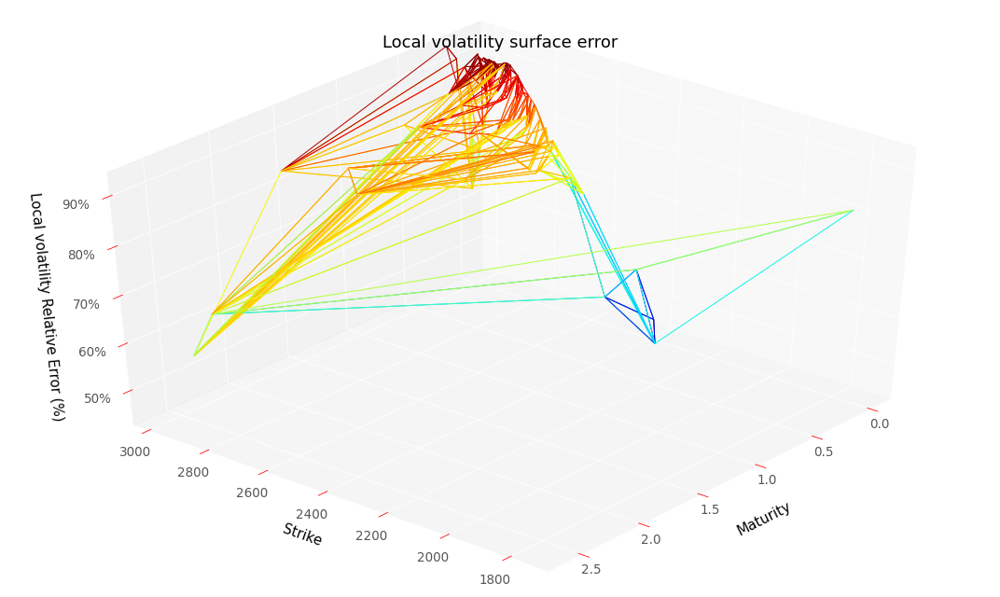

RMSE :  0.8370065986789647
RMSE Relative:  0.8370065986789647


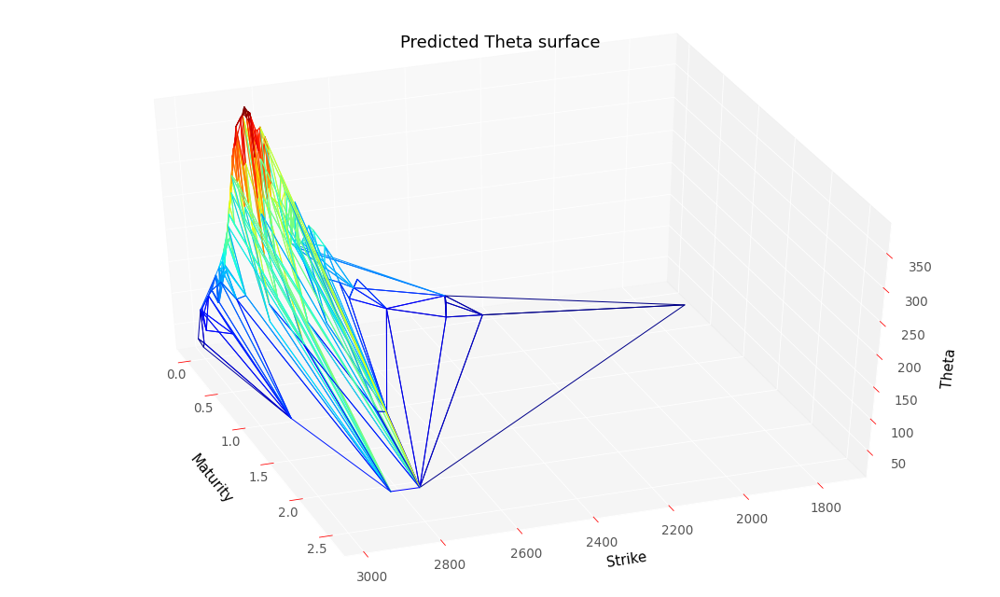

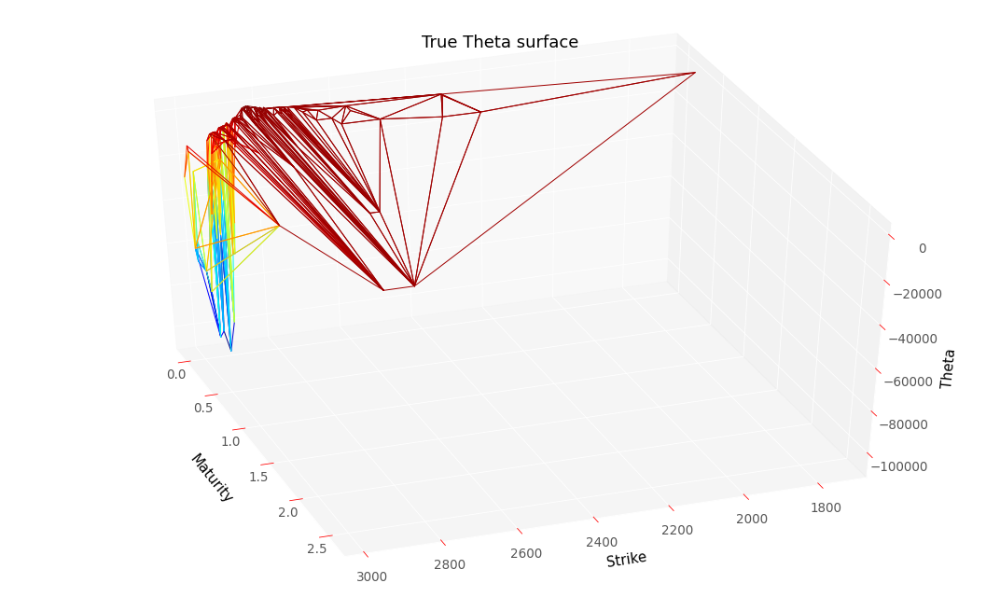

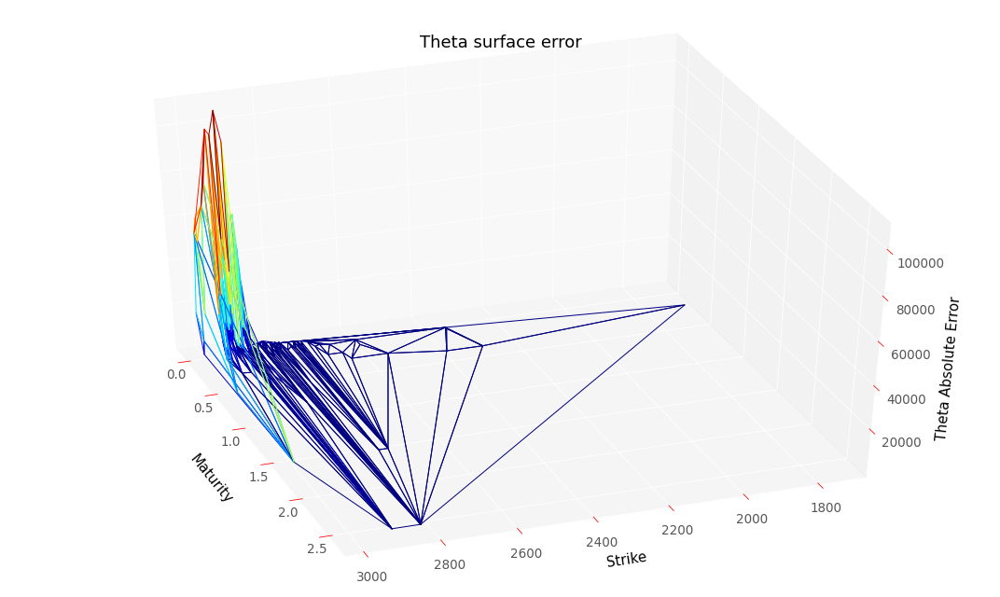

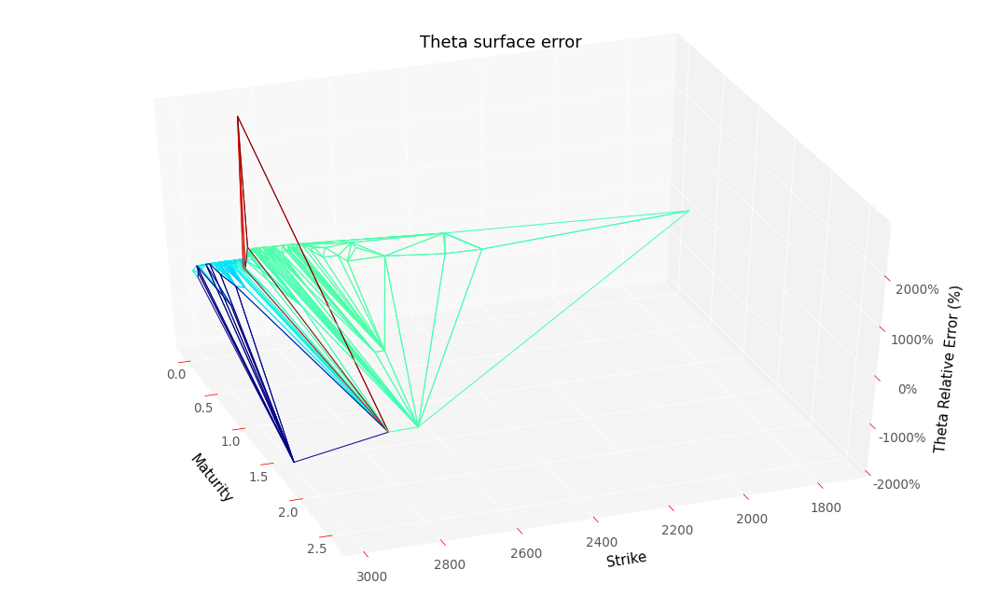

RMSE :  25095.768756147478
RMSE Relative:  3.1044773416762883


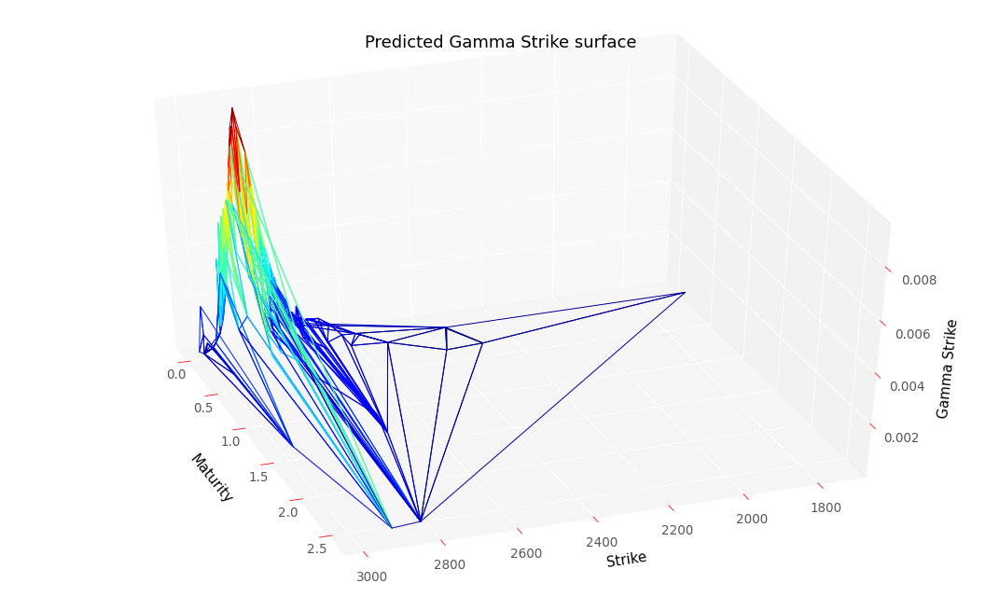

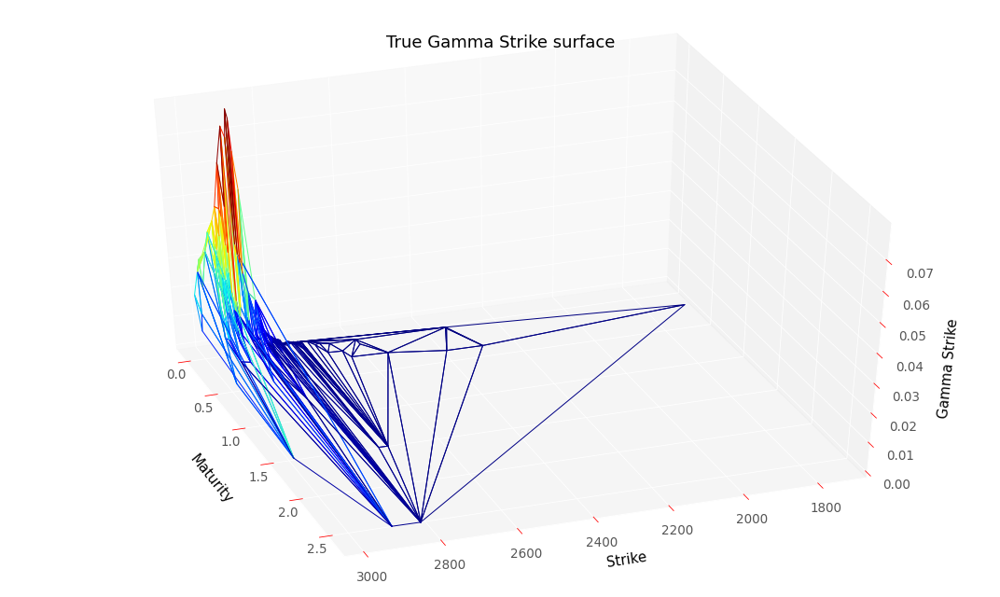

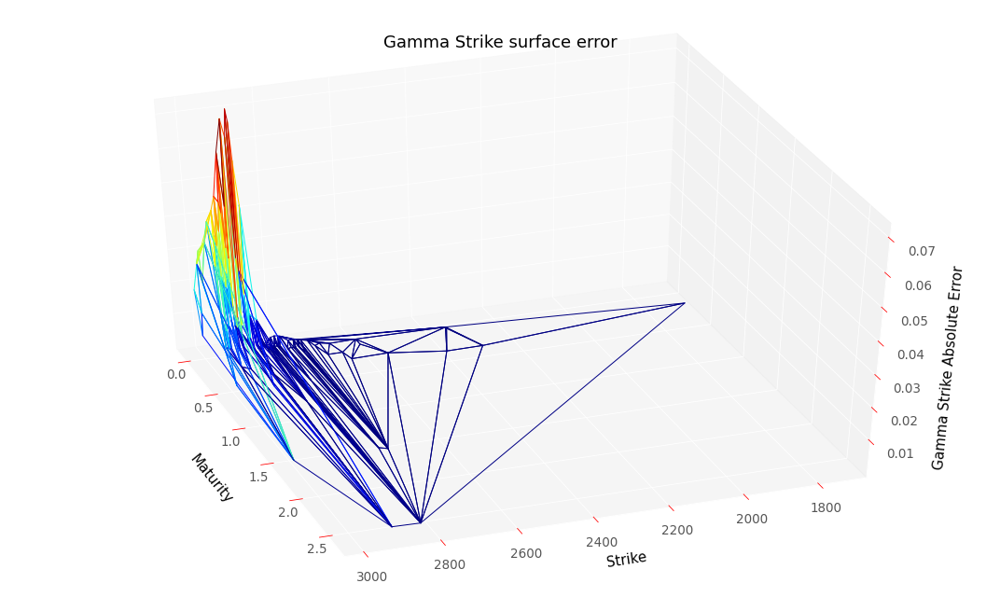

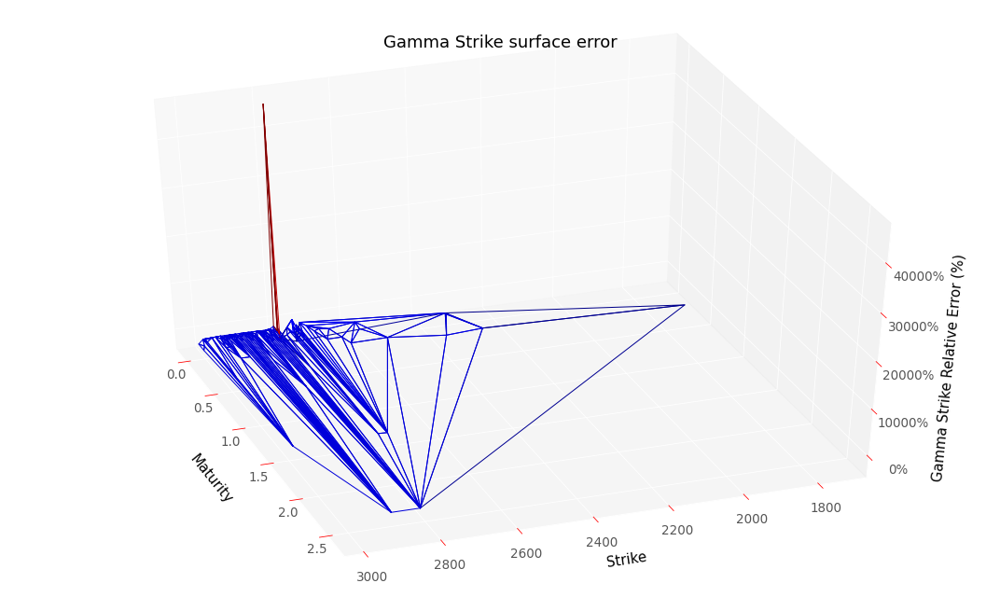

RMSE :  0.020523597954508407
RMSE Relative:  39.42141964677682


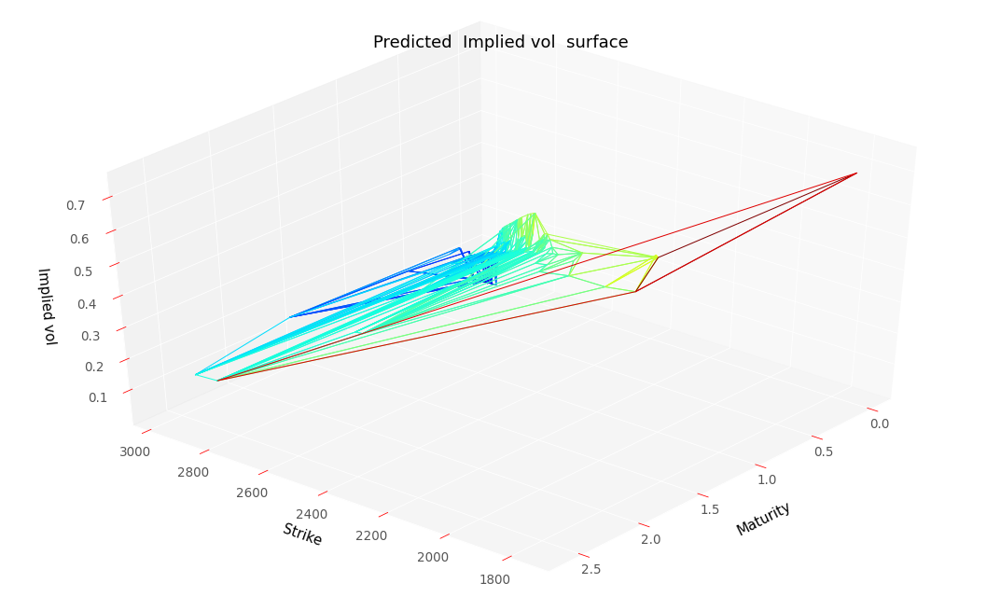

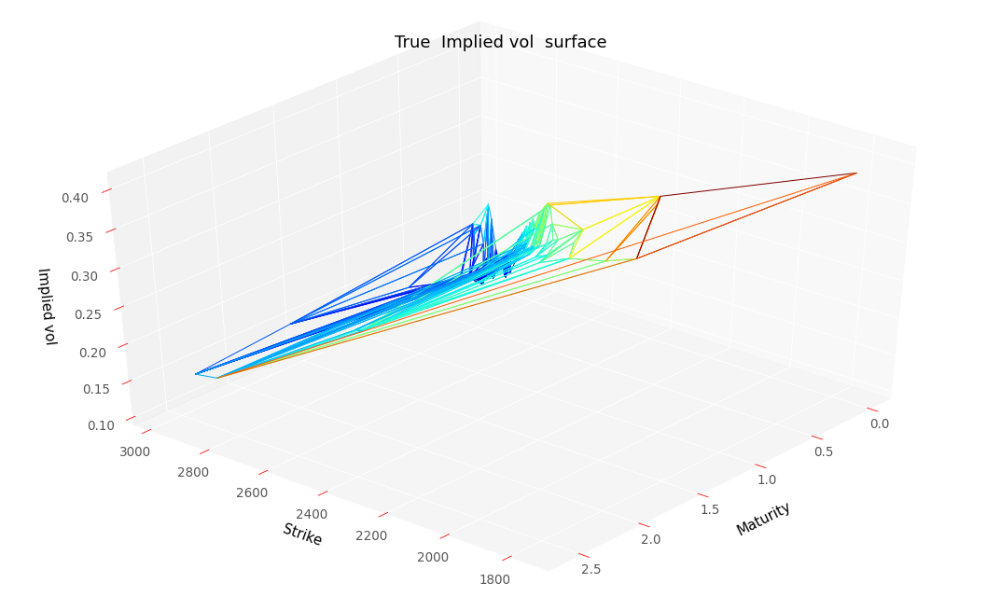

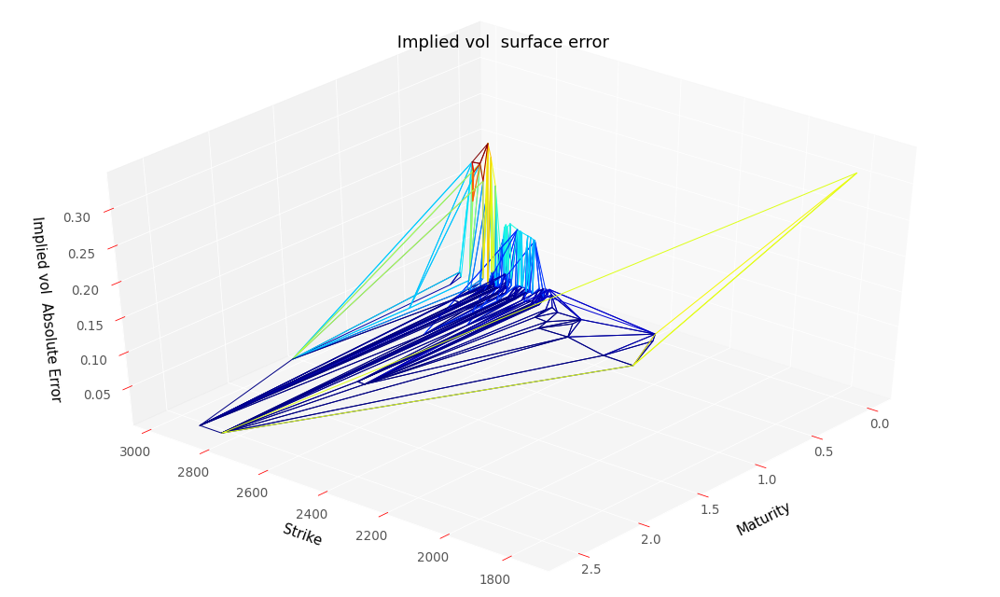

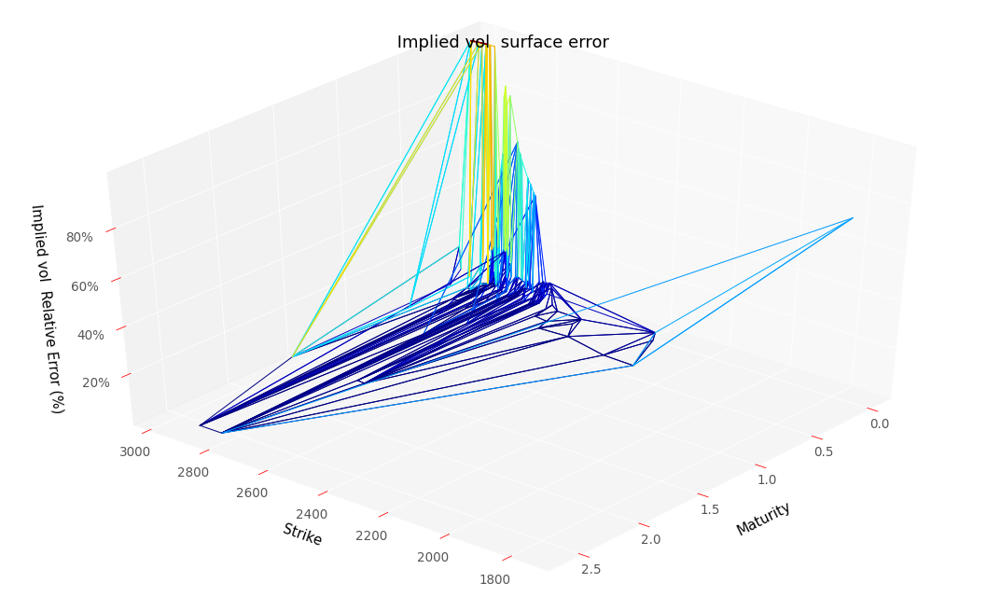

RMSE :  0.058301320419272294
RMSE Relative:  0.33973465003009745


In [63]:
# Evaluate results on the testing dataset, you can execute that cell without training the model
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                      scaledDataSetTest,
                                      True,
                                      hyperparameters,
                                      scaler,
                                      modelName = "regularizedUnconstrainedDupireVolModel")
y_pred2Test, volLocale2Test, dNN_T2Test, gNN_K2Test, lossSerie2TestG = res

plotTools.modelSummary(y_pred2Test,
                       volLocale2Test,
                       dNN_T2Test,
                       gNN_K2Test,
                       dataSetTest,
                       S0,
                       bootstrap,
                       yMin = KMin,
                       yMax = KMax,
                       thresholdPrice = None, 
                       removeNaN = False,
                       savePath = "NeuralRegularizedUnconstrainedPriceTest")

#### Monte Carlo and PDE repricing backtests

During Monte Carlo backtest, each option in testing set is priced with an underlying which is diffused with the following SDE : 
$$ dS_t = \left( r_t - q_t - \frac{\sigma_{NN}^2(t, S_t)}{2} \right) dt + \sigma_{NN}(t, S_t) dW_t$$
with $\sigma_{NN}$ the neural local volatility function.

Due to computation time issue we avoid to make millions of call to neural network and we interpolate linearly neural local volatility obtained on one the two possible grid :
- the testing grid i.e. nodes $(T,K)$ of the testing set.
- an artificial grid of 10000 points to check local volatility is correctly interpolated/extrapolated. That grid is the smallest rectangle containing the minimum and maximum maturities and the minimum and maximum strikes of our dataset (union of testing and training set).

During PDE backtest, we used a crank-nicholson scheme to revaluate each option in our testing set.
Time step corresponds to one day and space grid has 100 points. 


In [ ]:
S0

In [ ]:
# Function which evaluates neural local volatility when neural network is fitted on prices
def neuralVolLocalePrix(s,t):
    vLoc = neuralNetwork.evalVolLocale(neuralNetwork.NNArchitectureUnconstrainedDupire,
                                       s, t,
                                       dataSet,
                                       hyperparameters,
                                       scaler,
                                       bootstrap,
                                       S0,
                                       modelName = "regularizedUnconstrainedDupireVolModel")
    return vLoc.dropna()

In [ ]:
importlib.reload(neuralNetwork)

In [ ]:
#Artificial grid with 10000 points which aims to limit the impact of linear interpolation
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)

In [ ]:
volLocalInterp = neuralVolLocalePrix(volLocaleGrid[0].flatten(),
                                     volLocaleGrid[1].flatten())
volLocalInterp.head()

In [ ]:
volLocalInterp2 = neuralVolLocalePrix(dataSetTest.index.get_level_values("Strike").values.flatten(),
                                      dataSetTest.index.get_level_values("Maturity").values.flatten())
volLocalInterp2.head()

In [ ]:
#Local volatility function for backtests
nnVolLocale = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp, x, y)

In [ ]:
#Local volatility function for backtests
nnVolLocale2 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp2, x, y)

In [ ]:
plotTools.plotSerie(volLocalInterp,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

In [ ]:
plotTools.plotSerie(volLocalInterp2,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

Monte Carlo backtest, each option in testing set is priced with an underlying which is diffused with the following SDE : 
$$ dS_t = \left( r_t - q_t - \frac{\sigma_{NN}^2(t, S_t)}{2} \right) dt + \sigma_{NN}(t, S_t) dW_t$$
with $\sigma_{NN}$ the neural local volatility function.

In [ ]:
nbTimeStep = 100
nbPaths = 100000

In [ ]:
#Local volatility is returned through linear interpolation on neural local volatilities obtained on the 10000 points grid.
mcResVolLocalePrix = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSetTest,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocale)
mcResVolLocalePrix.head()

In [ ]:
plotTools.predictionDiagnosis(mcResVolLocalePrix["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocalePrix.to_csv("mcResVolLocaleUnconstrainedPrix.csv")

In [ ]:
#PDE backtest with cranck-nicolson scheme
pdeResVolLocale = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocale, bootstrap)
pdeResVolLocale.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResVolLocale, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResVolLocale.to_csv(workingFolder + "pdeResVolLocaleUnconstrained.csv")

In [ ]:
#Local volatility is returned through linear interpolation on neural local volatilities obtained on the testing grid.
mcResVolLocalePrix2 = backtest.MonteCarloPricerVectorized(S0,
                                                          dataSetTest,
                                                          bootstrap,
                                                          nbPaths,
                                                          nbTimeStep,
                                                          nnVolLocale2)
mcResVolLocalePrix2.head()

In [ ]:
plotTools.predictionDiagnosis(mcResVolLocalePrix2["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocalePrix2.to_csv("mcResVolLocaleUnconstrainedPrix2.csv")

In [ ]:
#PDE backtest with cranck-nicolson scheme
pdeResVolLocale2 = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocale2, bootstrap)
pdeResVolLocale2.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResVolLocale2, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResVolLocale2.to_csv(workingFolder + "pdeResVolLocaleUnconstrained2.csv")